##### A Credit Lending company seeks to expand its customer base by providing credit to individuals with insufficient or non-existent credit histories, while staying within adjustable risk limits to ensure a safe borrowing experience.

##### To support this goal, the company collects and maintains a variety of datasets, such as:

Application data

Credit bureau data

POS (Point of Sale) data

Credit card balance data

Installment payment data

Previous application records

These datasets are critical in uncovering patterns and insights related to risk behaviors and creditworthiness.



##### Deriving meaningful insights from all available datasets to help improve lending decisions.
##### Identifying patterns and behaviors indicative of potential default risk.
##### Assessing the predictive power of various variables with respect to loan default.
##### Ensuring data sufficiency for creating robust predictive models, especially for applicants with limited credit history.
##### Proposing strategies for lending to “thin-file” or “no-file” customers while maintaining acceptable risk.

### Import data

In [4]:
import os 

In [5]:
os.getcwd()

'C:\\Users\\Acer'

In [6]:
path="C:\\Users\\Acer\\OneDrive\\Desktop\\Data_Capstone-EDA (2)\\data"

In [7]:
import pandas as pd

In [8]:
CD1= pd.read_csv("C:\\Users\\Acer\\OneDrive\\Desktop\\Data_Capstone-EDA (2)\\data\\Application.csv")
CD2= pd.read_csv("C:\\Users\\Acer\\OneDrive\\Desktop\\Data_Capstone-EDA (2)\\data\\Bureau.csv")
CD3= pd.read_csv("C:\\Users\\Acer\\OneDrive\\Desktop\\Data_Capstone-EDA (2)\\data\\Bureau_Balance.csv")
CD4= pd.read_csv("C:\\Users\\Acer\\OneDrive\\Desktop\\Data_Capstone-EDA (2)\\data\\Credit_Card_Balance.csv")
CD5= pd.read_csv("C:\\Users\\Acer\\OneDrive\\Desktop\\Data_Capstone-EDA (2)\\data\\Installment_Payments.csv")
CD6= pd.read_csv("C:\\Users\\Acer\\OneDrive\\Desktop\\Data_Capstone-EDA (2)\\data\\POS_Cash_Balance.csv")
CD7= pd.read_csv("C:\\Users\\Acer\\OneDrive\\Desktop\\Data_Capstone-EDA (2)\\data\\Previous_Application.csv")

In [9]:
datasets = {
    'Application': CD1,
    'Bureau': CD2,
    'Bureau_Balance': CD3,
    'Credit_Card_Balance': CD4,
    'Installment_Payments': CD5,
    'POS_Cash_Balance': CD6,
    'Previous_Application': CD7
}

for name, df in datasets.items():
    print(f"\n=== {name} Dataset ===")
    print(df.dtypes.value_counts())



=== Application Dataset ===
float64    62
int64      44
object     16
Name: count, dtype: int64

=== Bureau Dataset ===
float64    8
int64      6
object     3
Name: count, dtype: int64

=== Bureau_Balance Dataset ===
int64     2
object    1
Name: count, dtype: int64

=== Credit_Card_Balance Dataset ===
float64    15
int64       7
object      1
Name: count, dtype: int64

=== Installment_Payments Dataset ===
int64      5
float64    3
Name: count, dtype: int64

=== POS_Cash_Balance Dataset ===
int64      5
float64    2
object     1
Name: count, dtype: int64

=== Previous_Application Dataset ===
object     16
float64    15
int64       6
Name: count, dtype: int64


####  Reusable Aggregation + Merge Function

In [11]:
import pandas as pd
import numpy as np

def aggregate_and_merge_all(main_df, secondary_df, key='SK_ID_CURR', prefix=''):
    # Split into numeric and categorical (excluding key)
    numeric_cols = secondary_df.select_dtypes(include=['int64', 'float64']).columns.drop(key, errors='ignore')
    cat_cols = secondary_df.select_dtypes(include='object').columns

    # Aggregate numeric columns
    numeric_agg = secondary_df.groupby(key)[numeric_cols].mean()

    # Aggregate categorical columns using mode
    def mode_or_nan(series):
        return series.mode().iloc[0] if not series.mode().empty else np.nan
    
    cat_agg = secondary_df.groupby(key)[cat_cols].agg(mode_or_nan)

    # Combine aggregated results
    agg_df = pd.concat([numeric_agg, cat_agg], axis=1).reset_index()

    # Add prefix to column names (except key)
    new_cols = [prefix + '_' + col if col != key else col for col in agg_df.columns]
    agg_df.columns = new_cols

    # Merge back into main_df
    merged_df = main_df.merge(agg_df, on=key, how='left')
    return merged_df


In [12]:
df = CD1.copy()
df = aggregate_and_merge_all(df, CD2, key='SK_ID_CURR', prefix='BUREAU')
df = aggregate_and_merge_all(df, CD7, key='SK_ID_CURR', prefix='PREV_APP')
df = aggregate_and_merge_all(df, CD6, key='SK_ID_CURR', prefix='POS')
df = aggregate_and_merge_all(df, CD5, key='SK_ID_CURR', prefix='INST')


### Credit Card Balance is linked by SK_ID_PREV, not directly SK_ID_CURR.

In [14]:
print("CD4 columns:", CD4.columns.tolist())
print("CD7 columns:", CD7.columns.tolist())


CD4 columns: ['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD', 'SK_DPD_DEF']
CD7 columns: ['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAM

#### From your list, both CD4 (Credit Card Balance) and CD7 (Previous Applications) do contain:

SK_ID_PREV

SK_ID_CURR

don't need to merge CD4 with CD7 at all — already have SK_ID_CURR in CD4.

In [16]:
# Use the master function you already defined
df = aggregate_and_merge_all(df, CD4, key='SK_ID_CURR', prefix='CC')


#### Dropping out zero values

In [18]:
zero_counts = (df == 0).sum()
zero_cols = zero_counts[zero_counts > 0].sort_values(ascending=False)
print(zero_cols)

FLAG_DOCUMENT_2                    15375
FLAG_DOCUMENT_12                   15375
FLAG_DOCUMENT_10                   15375
FLAG_DOCUMENT_4                    15375
FLAG_DOCUMENT_7                    15373
                                   ...  
YEARS_BUILD_MODE                       4
BUREAU_DAYS_CREDIT_ENDDATE             3
HOUR_APPR_PROCESS_START                2
DAYS_ID_PUBLISH                        1
PREV_APP_NFLAG_LAST_APPL_IN_DAY        1
Length: 133, dtype: int64


In [19]:
# Drop columns where all values are exactly zero
df = df.loc[:, ~(df == 0).all()]
print("Columns with all zero values (to be dropped):")
print(list(df))

Columns with all zero values (to be dropped):
['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_A

In [ ]:
### Interpretation 

In [20]:
# Drop columns where all values are NaN
df.dropna(axis=1, how='all', inplace=True)

print("Dropped columns with all NaN values.")


Dropped columns with all NaN values.


### Dealing with Missing value

In [22]:
missing_df = df.isnull().sum()
missing_df = missing_df[missing_df > 0].sort_values(ascending=False)
missing_pct = (missing_df / len(df)) * 100

missing_summary = pd.DataFrame({
    'Missing Count': missing_df,
    'Missing %': missing_pct
})

print(missing_summary)


                                   Missing Count  Missing %
PREV_APP_RATE_INTEREST_PRIMARY             15133  98.426016
PREV_APP_RATE_INTEREST_PRIVILEGED          15133  98.426016
CC_AMT_PAYMENT_CURRENT                     12338  80.247154
CC_AMT_DRAWINGS_POS_CURRENT                12337  80.240650
CC_CNT_DRAWINGS_ATM_CURRENT                12337  80.240650
...                                          ...        ...
OBS_60_CNT_SOCIAL_CIRCLE                      61   0.396748
DEF_30_CNT_SOCIAL_CIRCLE                      61   0.396748
NAME_TYPE_SUITE                               60   0.390244
EXT_SOURCE_2                                  30   0.195122
AMT_GOODS_PRICE                               14   0.091057

[152 rows x 2 columns]


In [23]:
high_missing = missing_summary[missing_summary['Missing %'] > 30].index
df.drop(columns=high_missing, inplace=True)
print(f"Dropped columns with >50% missing: {list(high_missing)}")


Dropped columns with >50% missing: ['PREV_APP_RATE_INTEREST_PRIMARY', 'PREV_APP_RATE_INTEREST_PRIVILEGED', 'CC_AMT_PAYMENT_CURRENT', 'CC_AMT_DRAWINGS_POS_CURRENT', 'CC_CNT_DRAWINGS_ATM_CURRENT', 'CC_CNT_DRAWINGS_POS_CURRENT', 'CC_AMT_DRAWINGS_ATM_CURRENT', 'CC_CNT_DRAWINGS_OTHER_CURRENT', 'CC_AMT_DRAWINGS_OTHER_CURRENT', 'BUREAU_AMT_ANNUITY', 'CC_AMT_BALANCE', 'CC_SK_ID_PREV', 'CC_AMT_PAYMENT_TOTAL_CURRENT', 'CC_AMT_DRAWINGS_CURRENT', 'CC_AMT_CREDIT_LIMIT_ACTUAL', 'CC_MONTHS_BALANCE', 'CC_AMT_TOTAL_RECEIVABLE', 'CC_AMT_RECIVABLE', 'CC_NAME_CONTRACT_STATUS', 'CC_SK_DPD_DEF', 'CC_CNT_DRAWINGS_CURRENT', 'CC_AMT_RECEIVABLE_PRINCIPAL', 'CC_SK_DPD', 'CC_AMT_INST_MIN_REGULARITY', 'CC_CNT_INSTALMENT_MATURE_CUM', 'COMMONAREA_MODE', 'COMMONAREA_MEDI', 'COMMONAREA_AVG', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG', 'FONDKAPREMONT_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAPARTMENTS_AVG', 'LIVINGAPARTMENTS_MEDI', 'FLOORSMIN_MEDI', 'FLOORSMIN_AVG', 'FLOORSMIN_MODE'

In [24]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns
df[num_cols] = df[num_cols].fillna(df[num_cols].median())


In [25]:
cat_cols = df.select_dtypes(include='object').columns
for col in cat_cols:
    df[col] = df[col].fillna(df[col].mode()[0])


In [26]:
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,POS_SK_DPD,POS_SK_DPD_DEF,POS_NAME_CONTRACT_STATUS,INST_SK_ID_PREV,INST_NUM_INSTALMENT_VERSION,INST_NUM_INSTALMENT_NUMBER,INST_DAYS_INSTALMENT,INST_DAYS_ENTRY_PAYMENT,INST_AMT_INSTALMENT,INST_AMT_PAYMENT
0,338371,0,Cash loans,F,N,Y,0,157500.0,755190.0,32125.5,...,0.000000,0.000000,Active,1.039763e+06,1.000000,9.000000,-2877.000000,-2877.000000,9278.895000,9278.895000
1,269239,0,Revolving loans,M,Y,N,0,135000.0,270000.0,13500.0,...,734.181818,0.000000,Active,1.392165e+06,1.000000,4.785714,-1509.714286,-1510.666667,7160.801786,6042.245357
2,256582,0,Cash loans,M,Y,Y,0,247500.0,379008.0,40815.0,...,0.259259,0.259259,Active,1.422646e+06,1.035714,8.321429,-993.071429,-999.464286,57827.031429,52539.222857
3,303107,0,Cash loans,F,N,N,0,101250.0,328500.0,20097.0,...,0.000000,0.000000,Active,1.257502e+06,1.000000,5.500000,-2483.000000,-2503.500000,5659.713000,5659.713000
4,385024,0,Cash loans,F,N,N,0,139500.0,432661.5,16834.5,...,0.000000,0.000000,Active,1.430145e+06,1.000000,3.500000,-95.000000,-119.666667,3595.770000,3595.770000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15370,253714,1,Cash loans,F,N,N,0,180000.0,506902.5,40180.5,...,0.000000,0.000000,Active,1.261657e+06,1.142857,3.857143,-1414.928571,-1439.071429,12456.061071,12456.061071
15371,210293,1,Cash loans,F,N,Y,0,90000.0,640080.0,31261.5,...,0.000000,0.000000,Active,1.445565e+06,1.000000,3.500000,-426.000000,-430.833333,9992.085000,9992.085000
15372,327049,1,Cash loans,F,N,Y,2,81000.0,375322.5,26820.0,...,0.000000,0.000000,Active,2.308186e+06,1.000000,5.633333,-1390.600000,-1401.400000,9708.612000,9197.754000
15373,377002,1,Cash loans,F,Y,Y,2,157500.0,979992.0,34717.5,...,0.000000,0.000000,Active,1.698616e+06,1.000000,6.076923,-760.923077,-777.461538,7954.587692,7954.587692


 #### Checking Duplicate

In [28]:
duplicates = df.duplicated()
print(f"Total duplicate rows: {duplicates.sum()}")

Total duplicate rows: 0


### Determining outliers 

In [30]:
import pandas as pd

outlier_info = {}

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower) | (df[col] > upper)]
    outlier_info[col] = {
        'outlier_count': outliers.shape[0],
        'percent_outliers': 100 * outliers.shape[0] / df.shape[0]
    }

# Create summary DataFrame
outlier_df = pd.DataFrame(outlier_info).T.sort_values(by='percent_outliers', ascending=False)

# View
print(outlier_df.head(20))


                                    outlier_count  percent_outliers
INST_NUM_INSTALMENT_VERSION                4532.0         29.476423
REGION_RATING_CLIENT                       4012.0         26.094309
REGION_RATING_CLIENT_W_CITY                3875.0         25.203252
REG_CITY_NOT_WORK_CITY                     3558.0         23.141463
DAYS_EMPLOYED                              3548.0         23.076423
FLAG_WORK_PHONE                            3046.0         19.811382
LIVE_CITY_NOT_WORK_CITY                    2772.0         18.029268
FLAG_EMP_PHONE                             2704.0         17.586992
POS_SK_DPD                                 2663.0         17.320325
PREV_APP_DAYS_FIRST_DRAWING                2634.0         17.131707
PREV_APP_DAYS_LAST_DUE_1ST_VERSION         2593.0         16.865041
AMT_REQ_CREDIT_BUREAU_QRT                  2491.0         16.201626
BUREAU_AMT_CREDIT_SUM_LIMIT                2485.0         16.162602
AMT_REQ_CREDIT_BUREAU_MON                  2210.

INST_NUM_INSTALMENT_VERSION has the highest outlier percentage (~29.5%).

These outliers may correspond to special or irregular loan types.

Recommendation: Consider capping or binning these values, or treating separately in modeling.

REGION_RATING_CLIENT and REGION_RATING_CLIENT_W_CITY show ~25–26% outliers.

These are typically discrete rating levels (1, 2, 3).

Recommendation: Not to remove; treat as categorical variables or use as-is.

Binary indicators like REG_CITY_NOT_WORK_CITY and LIVE_CITY_NOT_WORK_CITY show ~20–23% "outliers."

These are not true outliers — the high percentage just reflects rare values (1s).

Recommendation: Keep them; they may be useful flags for location-related risk.

DAYS_EMPLOYED has a known placeholder value 365243, causing ~23% outliers.

This represents missing or unknown employment info.

Recommendation: Replace 365243 with NaN and handle with imputation or a missing flag.

In [32]:
#### DAYS_EMPLOYED has a known placeholder value 365243, causing ~23% outliers.
import pandas as pd
import numpy as np

# Assuming df is your DataFrame
# Replace placeholder with NaN
df['DAYS_EMPLOYED'].replace(365243, np.nan)

# Optionally add a missing flag column
df['DAYS_EMPLOYED_MISSING'] = df['DAYS_EMPLOYED'].isna().astype(int)


C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\365910713.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['DAYS_EMPLOYED_MISSING'] = df['DAYS_EMPLOYED'].isna().astype(int)


In [33]:
### categorical representation

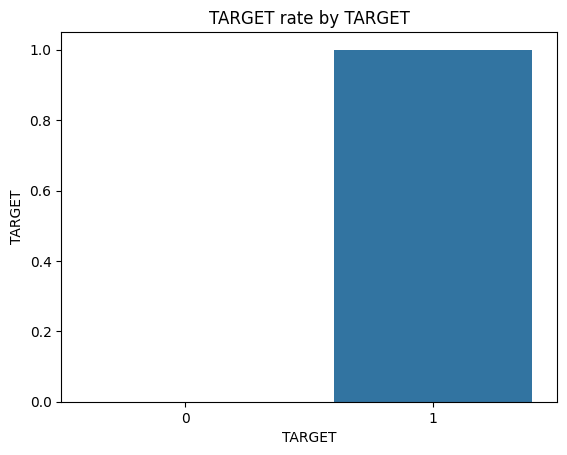

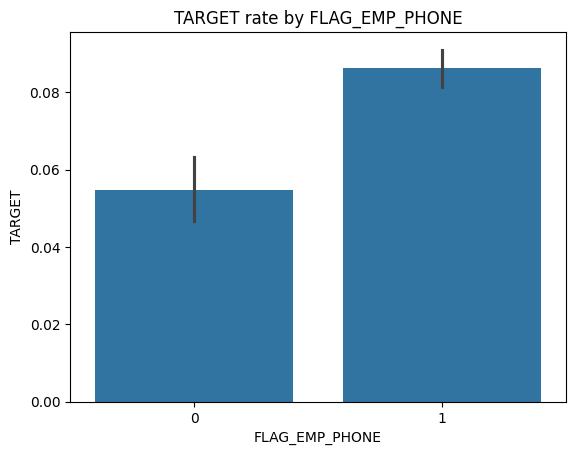

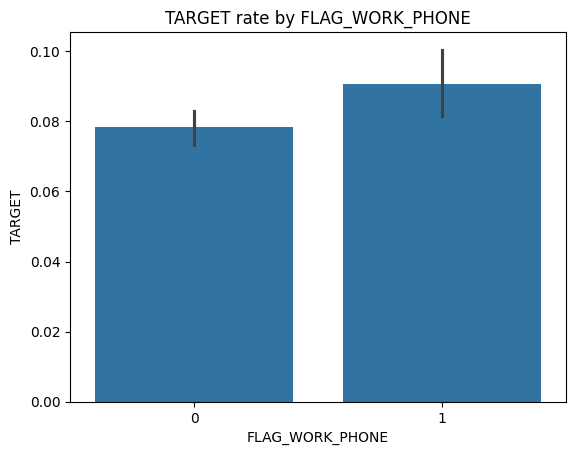

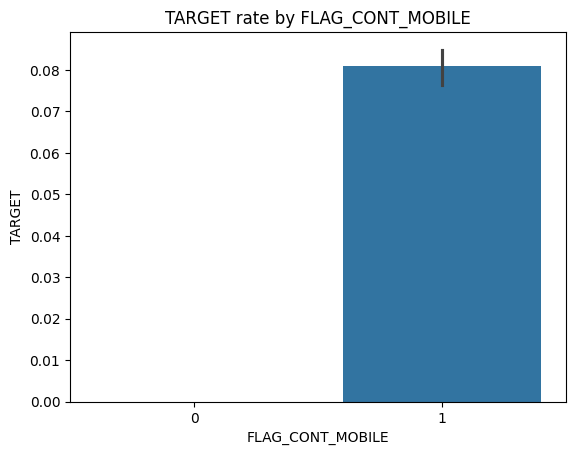

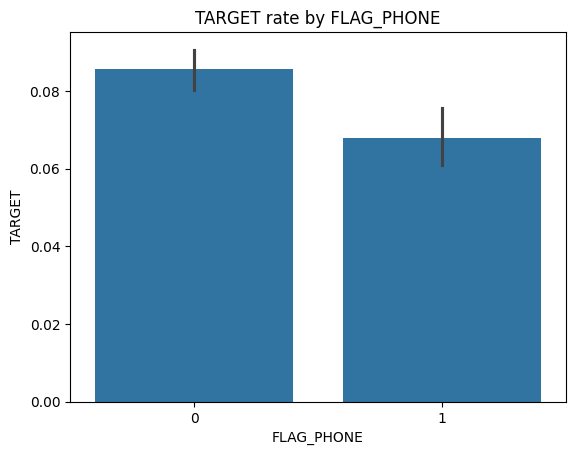

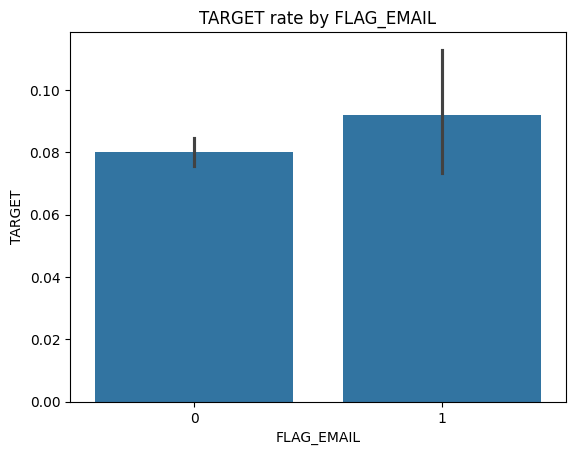

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

binary_cols = [col for col in df.columns if df[col].nunique() == 2 and df[col].dtype != 'object']

for col in binary_cols[:6]:  # Show a few examples
    sns.barplot(x=col, y='TARGET', data=df)
    plt.title(f'TARGET rate by {col}')
    plt.show()


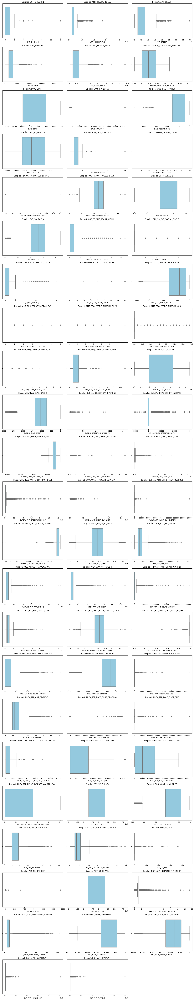

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Select numeric columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Step 2: Exclude ID, target, and binary columns (with only 2 unique values)
num_cols = [
    col for col in num_cols 
    if col not in ['SK_ID_CURR', 'TARGET'] and df[col].nunique() > 2
]

# Step 3: Set up grid layout
n = len(num_cols)
cols = 3  # boxplots per row
rows = (n // cols) + (n % cols > 0)

fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 4))
axes = axes.flatten()

# Step 4: Plot each boxplot
for i, col in enumerate(num_cols):
    sns.boxplot(x=df[col], ax=axes[i], color='skyblue')
    axes[i].set_title(f'Boxplot: {col}')

# Step 5: Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


## Univariate analysis

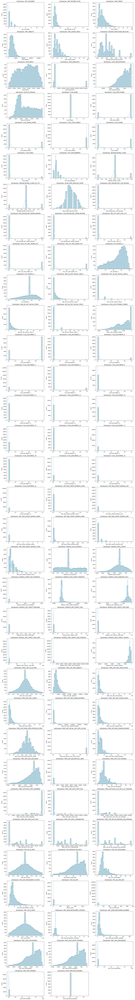

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select numerical features (excluding ID/TARGET)
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
num_cols = [col for col in num_cols if col not in ['SK_ID_CURR', 'TARGET']]

# Grid size
n = len(num_cols)
cols = 3
rows = (n // cols) + (n % cols > 0)

# Plot histograms
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 4))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.histplot(df[col], kde=True, ax=axes[i], bins=30, color='skyblue')
    axes[i].set_title(f'Distribution: {col}')

for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


### KDE PLOT 

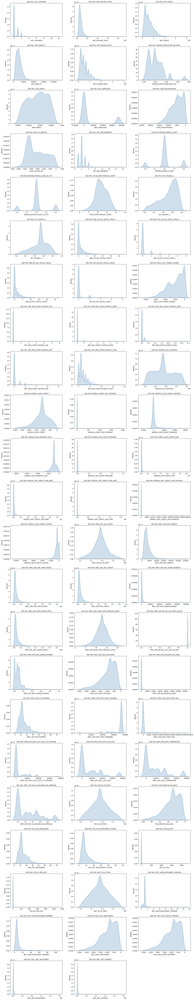

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Select numeric features (excluding ID/TARGET)
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
num_cols = [col for col in num_cols if col not in ['SK_ID_CURR', 'TARGET']]
num_cols = [col for col in num_cols if df[col].nunique() > 2]  # skip binary

# Step 2: Define grid
n = len(num_cols)
cols = 3
rows = (n // cols) + (n % cols > 0)

# Step 3: Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 4))
axes = axes.flatten()

# Step 4: Plot KDE for each column
for i, col in enumerate(num_cols):
    sns.kdeplot(data=df, x=col, ax=axes[i], fill=True, color='steelblue')
    axes[i].set_title(f'KDE Plot: {col}', fontsize=10)

# Hide unused axes
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


In [40]:
print(df.columns.tolist())

['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'FL

#### BIVARIATE ANALYSIS

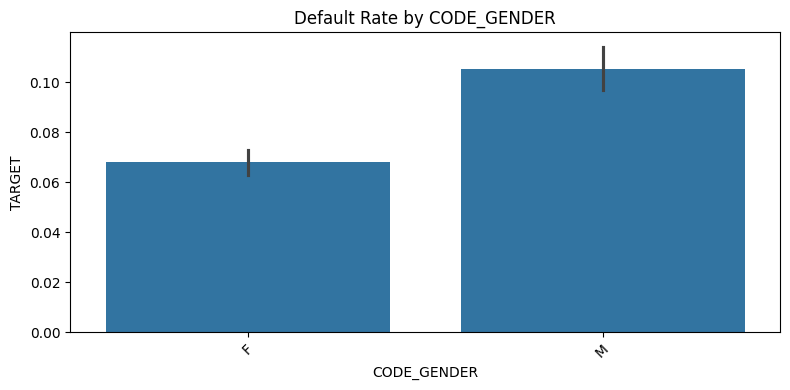

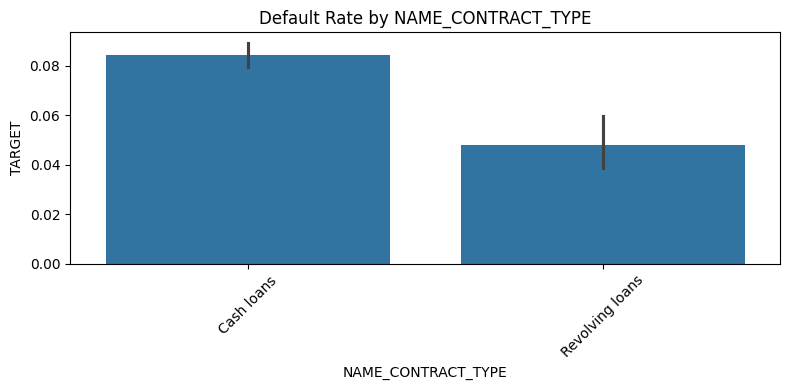

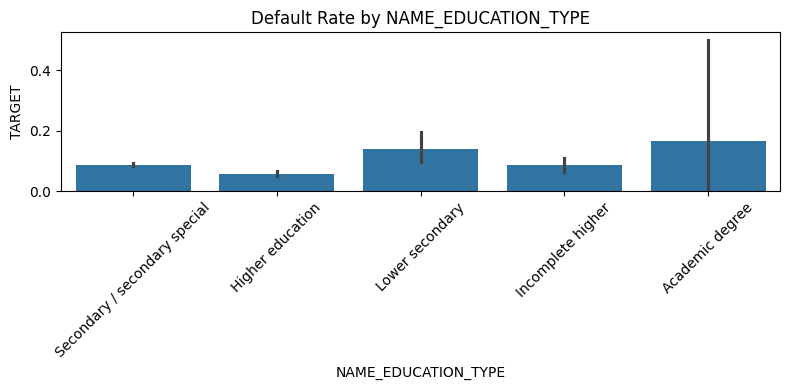

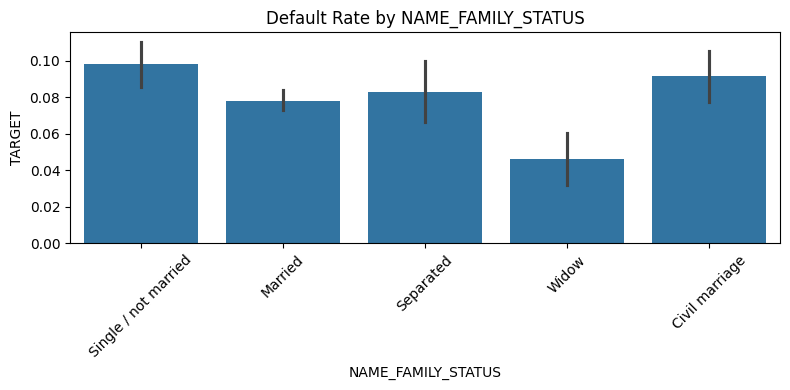

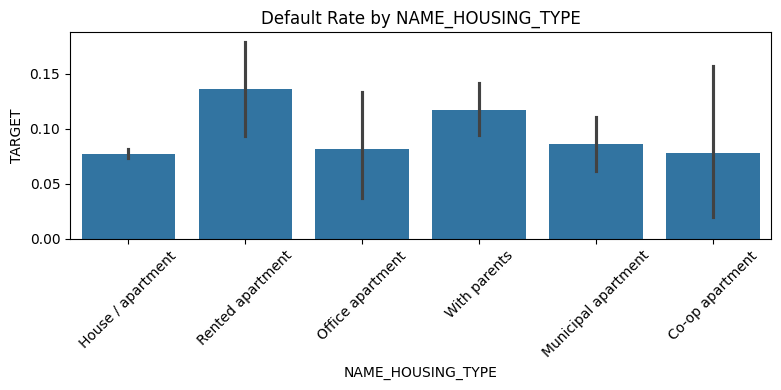

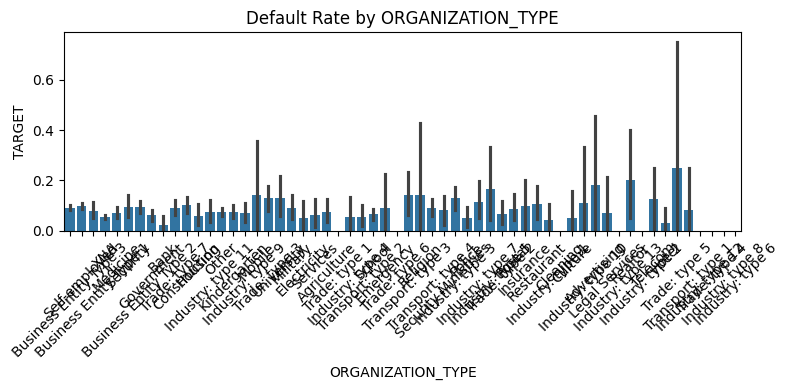

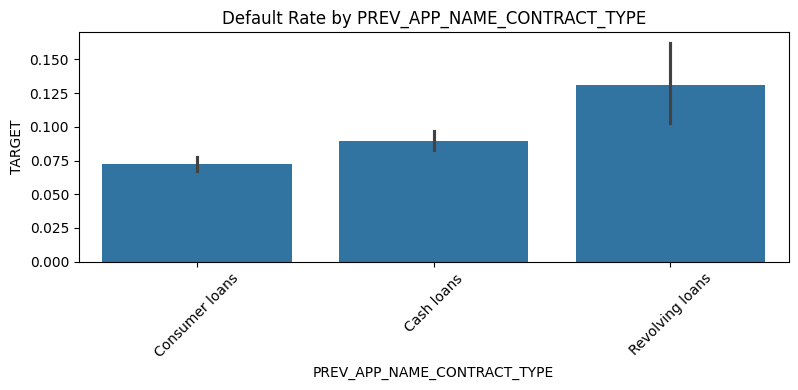

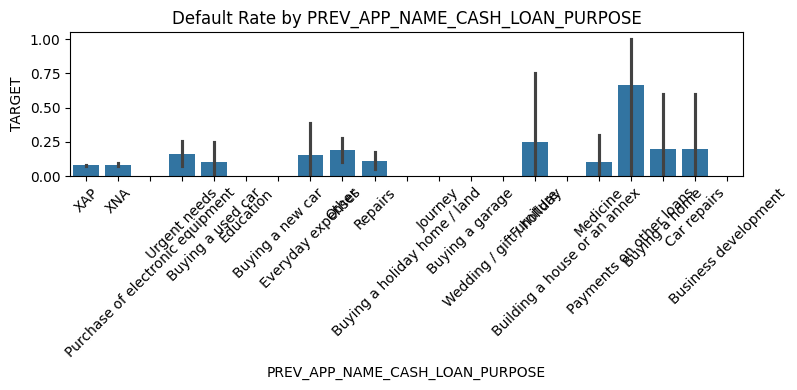

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

categorical_cols = [
    'CODE_GENDER', 'NAME_CONTRACT_TYPE', 'NAME_EDUCATION_TYPE',
    'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'ORGANIZATION_TYPE',
    'PREV_APP_NAME_CONTRACT_TYPE', 'PREV_APP_NAME_CASH_LOAN_PURPOSE'
]

for col in categorical_cols:
    plt.figure(figsize=(8, 4))
    sns.barplot(x=col, y='TARGET', data=df)
    plt.xticks(rotation=45)
    plt.title(f'Default Rate by {col}')
    plt.tight_layout()
    plt.show()


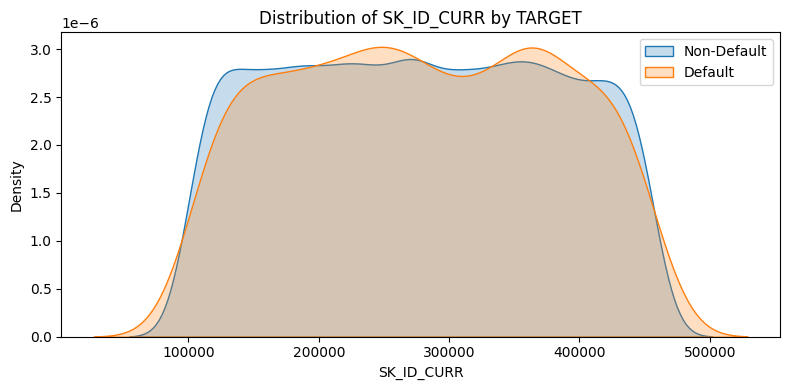

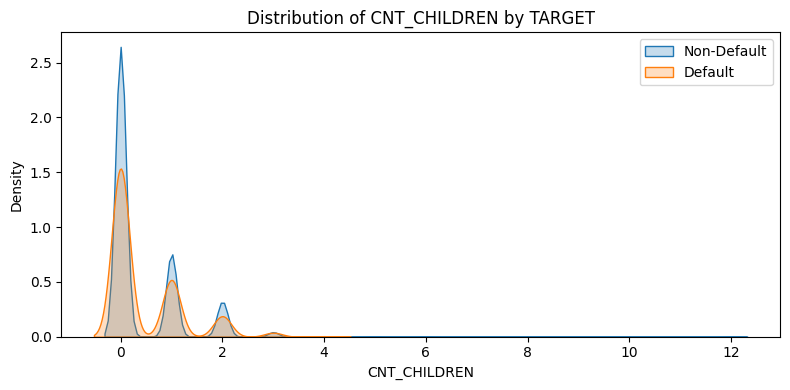

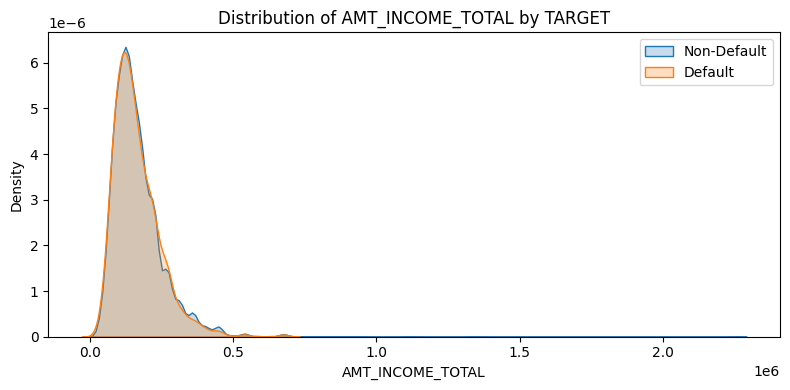

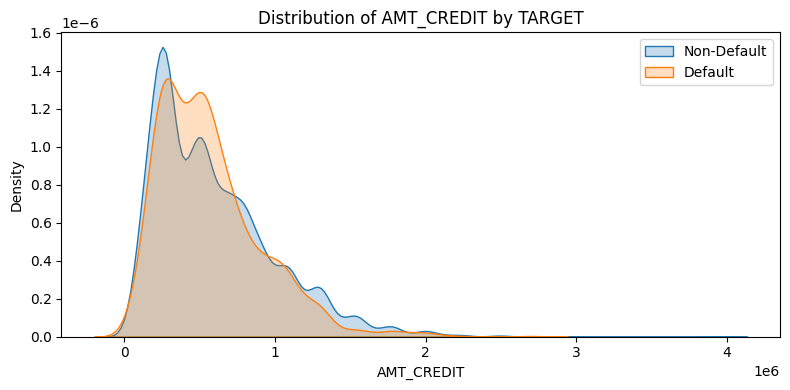

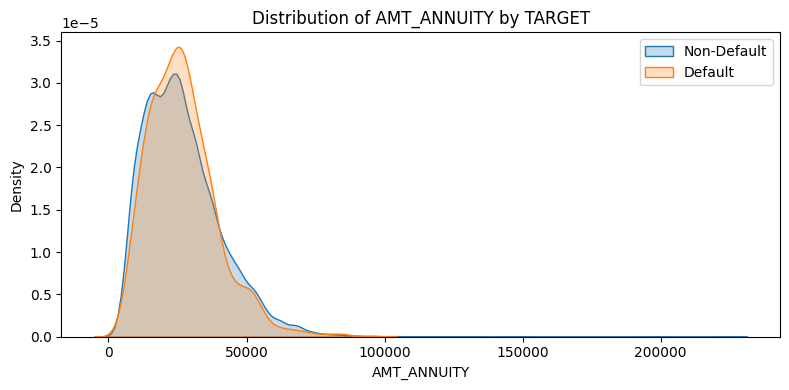

...

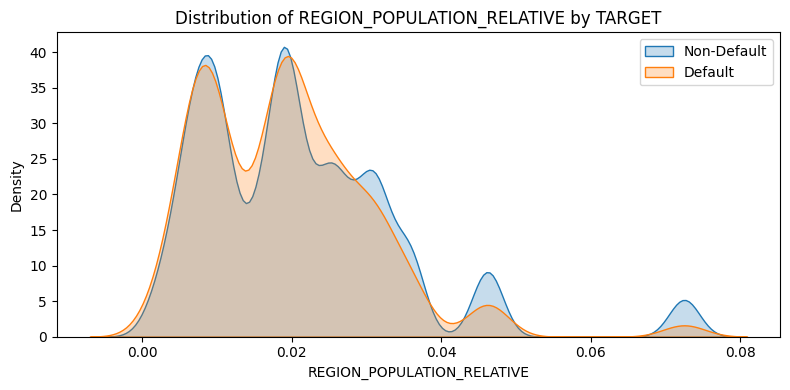

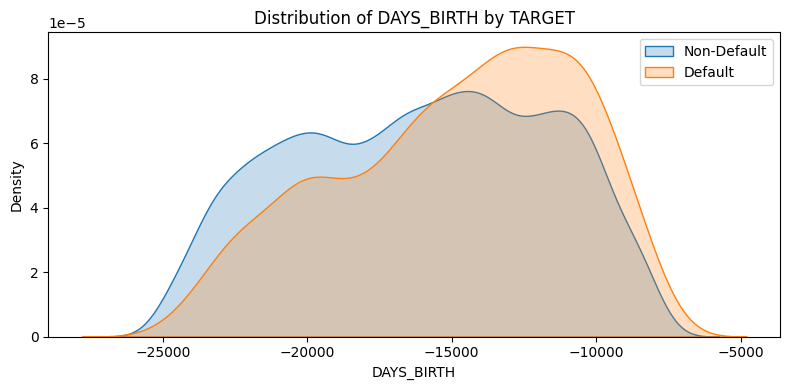

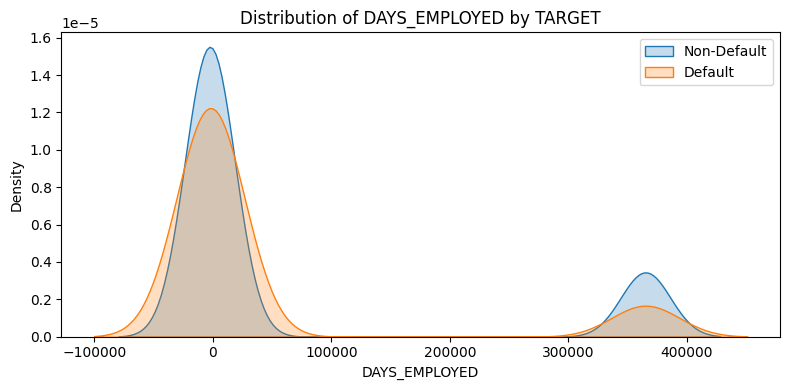

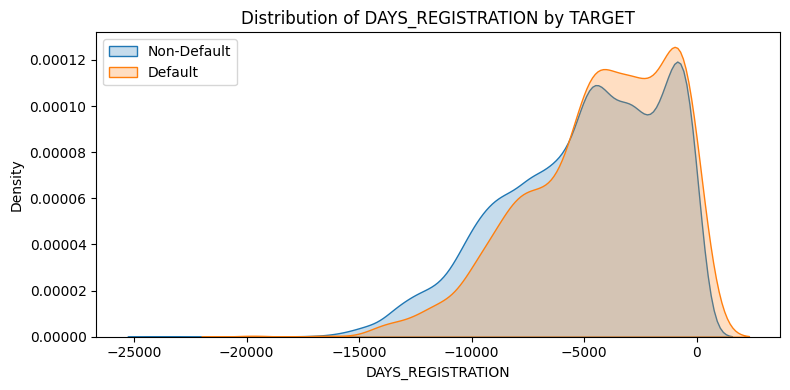

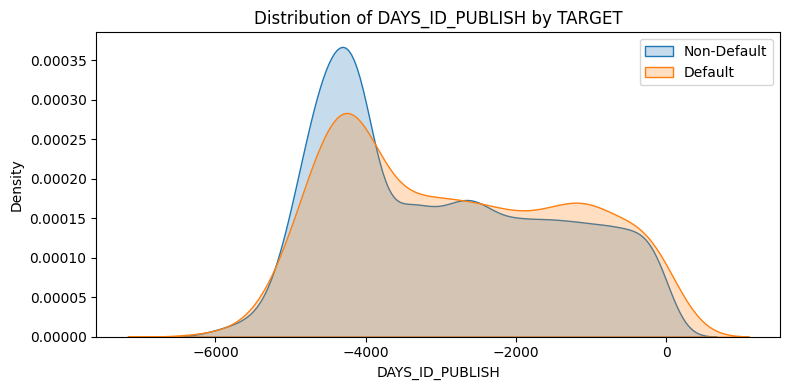

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 0], x=col, label='Non-Default', fill=True)
C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)
C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


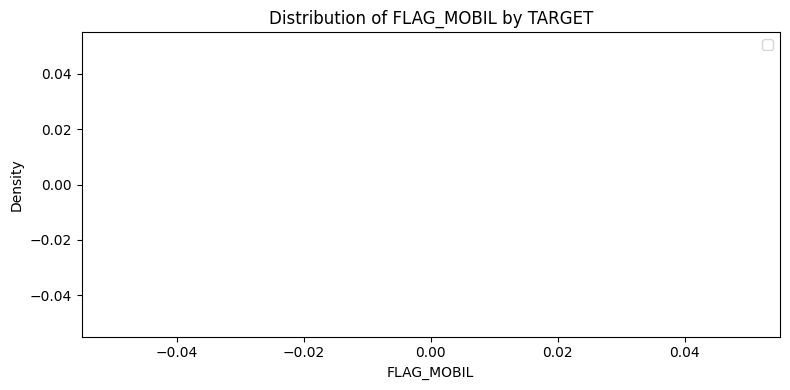

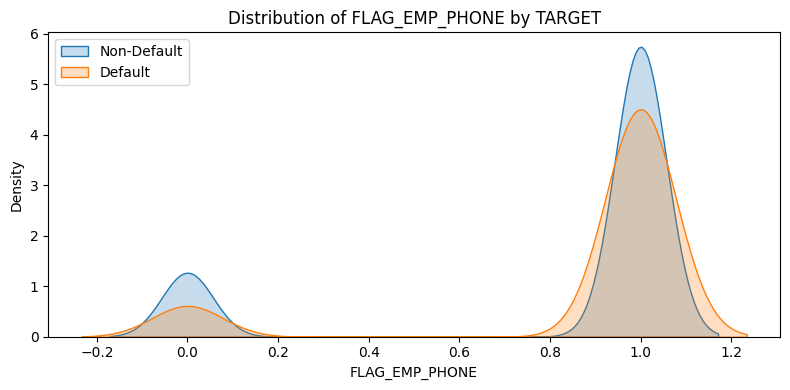

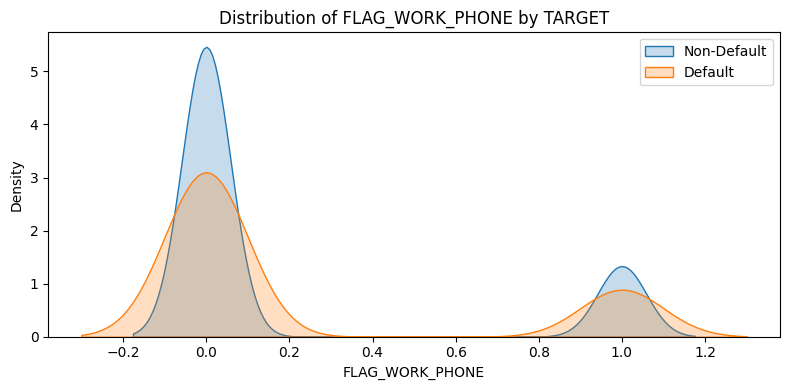

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)


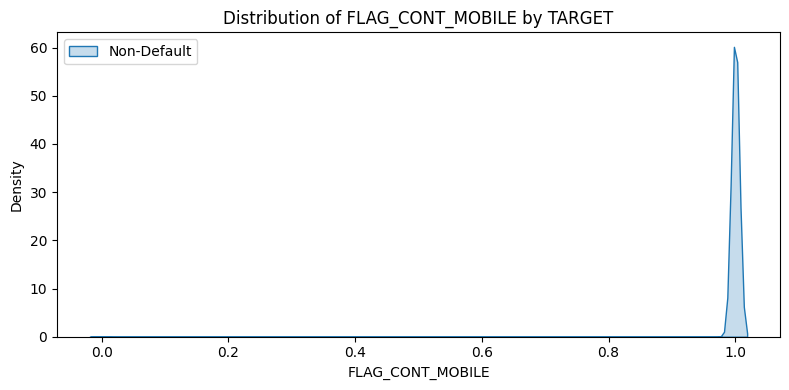

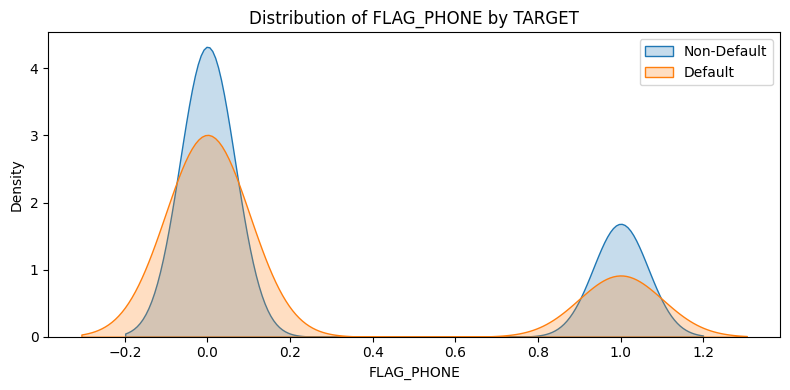

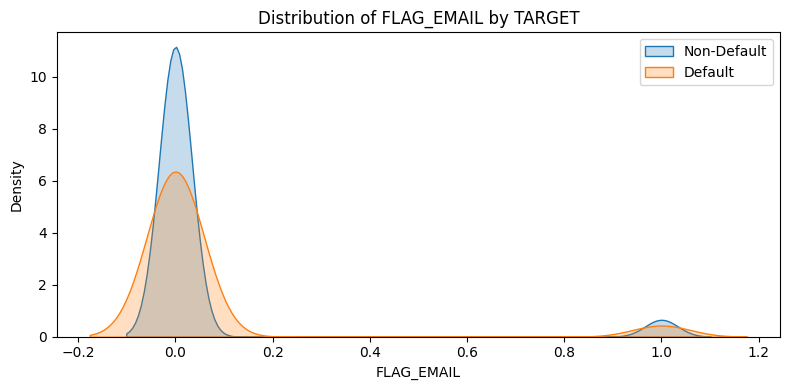

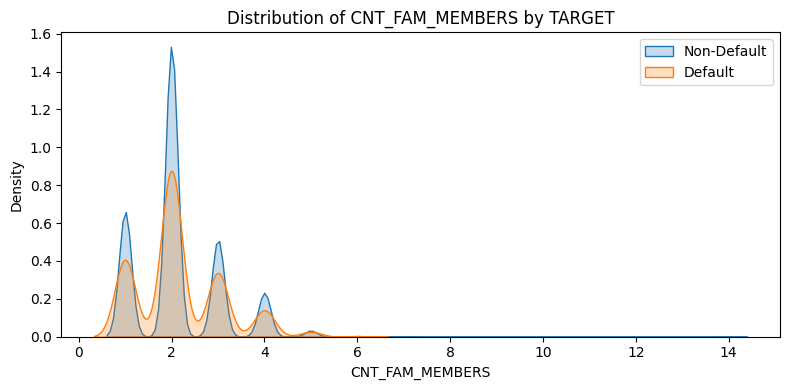

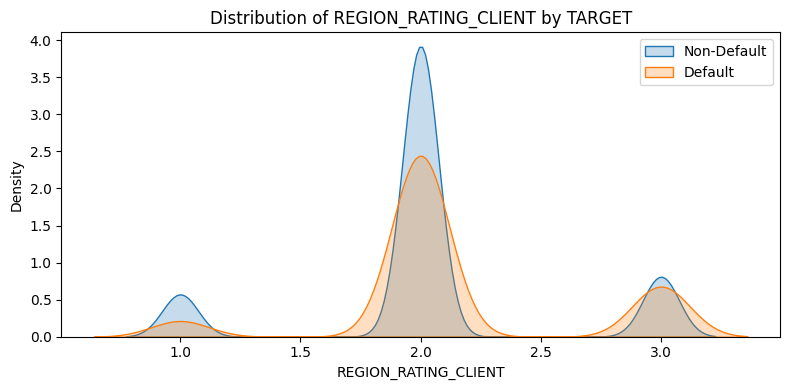

...

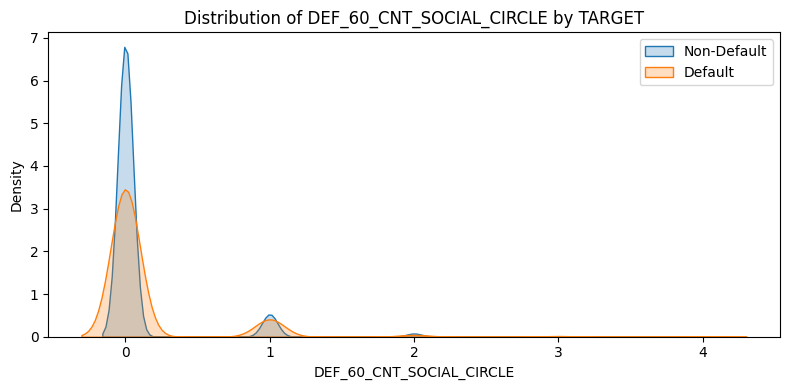

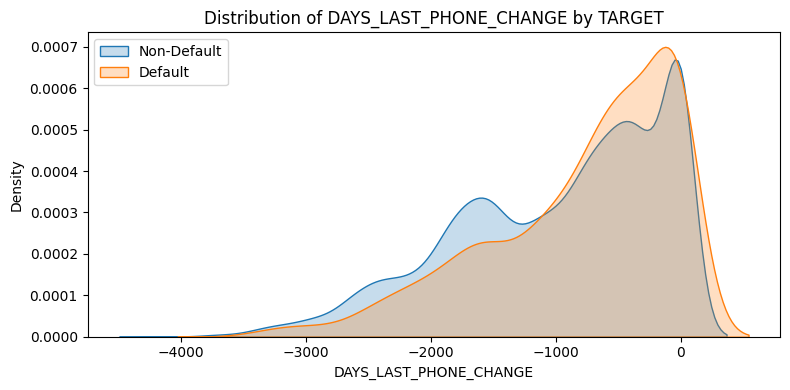

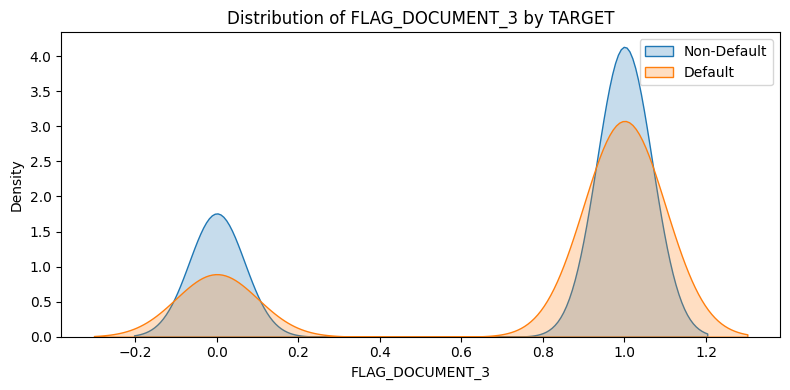

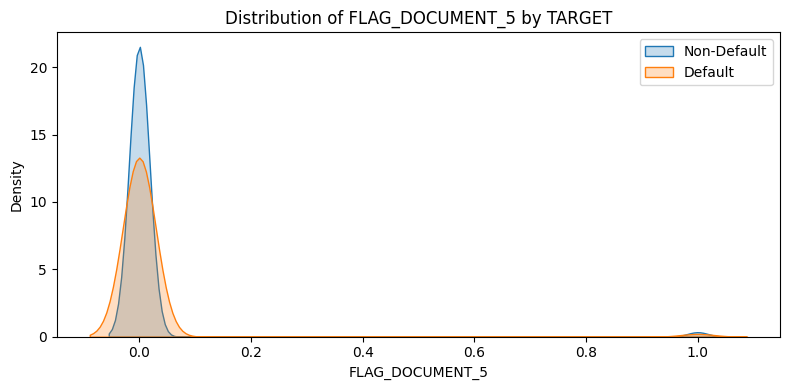

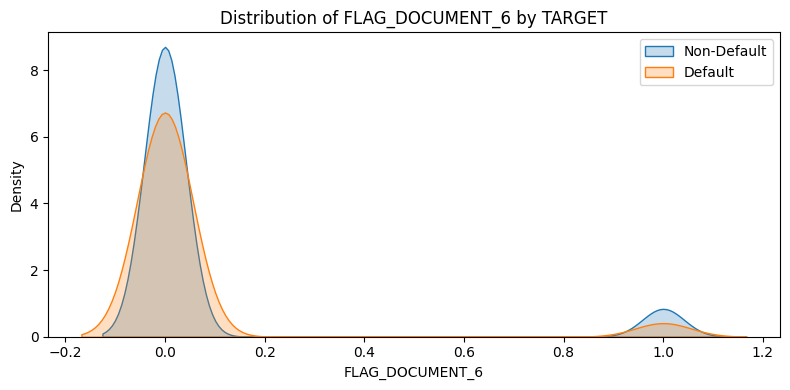

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)


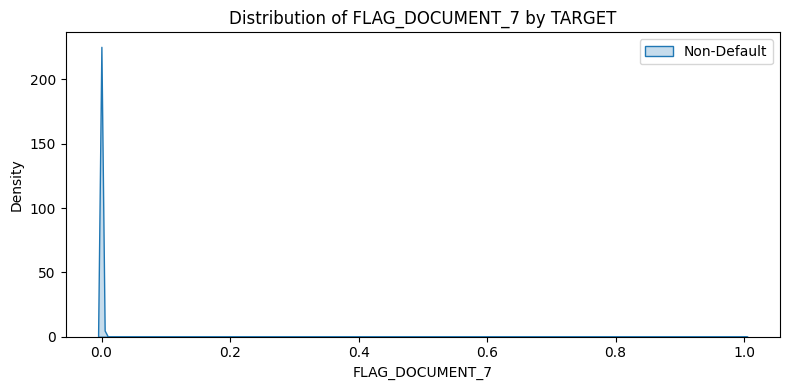

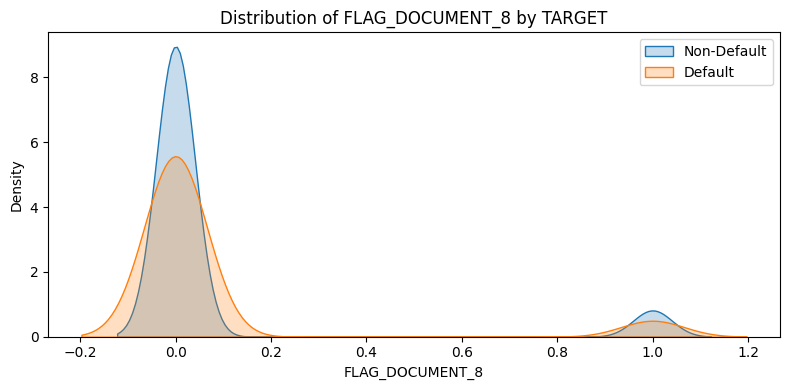

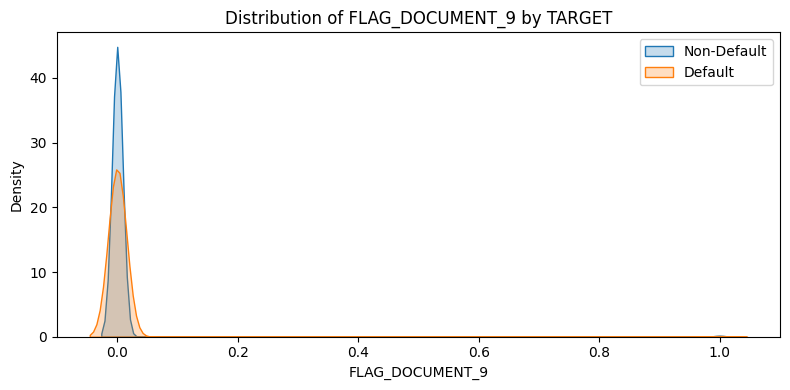

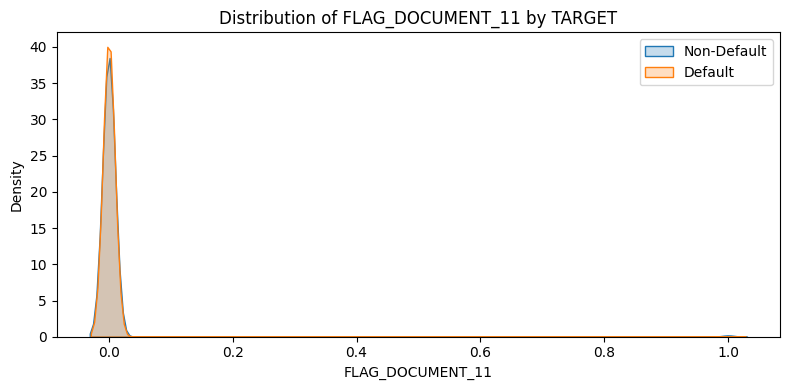

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)


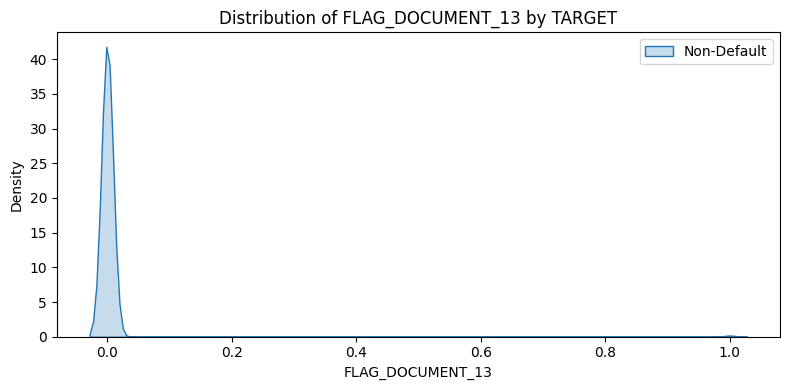

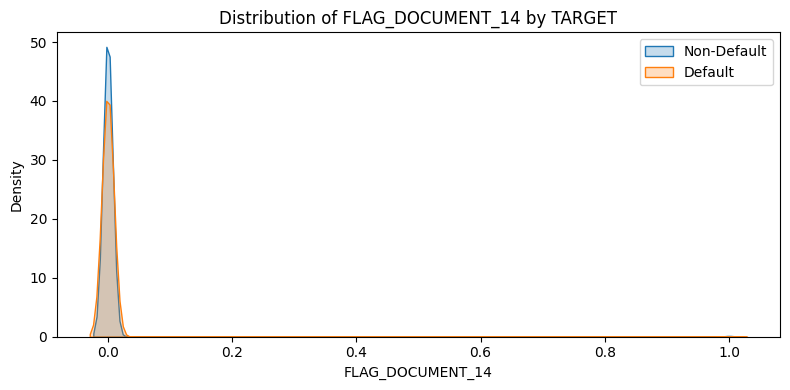

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)


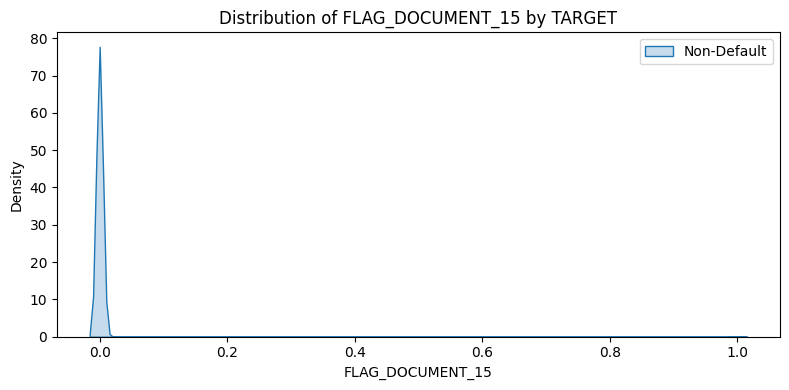

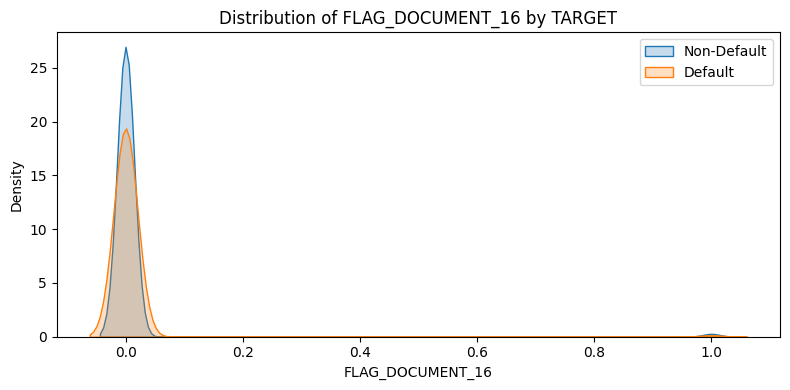

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)


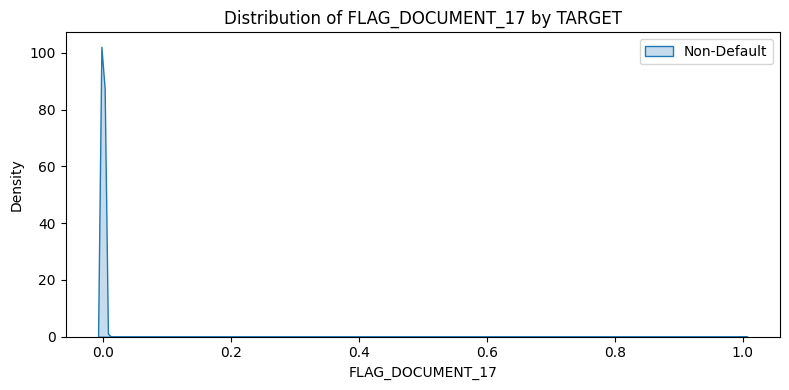

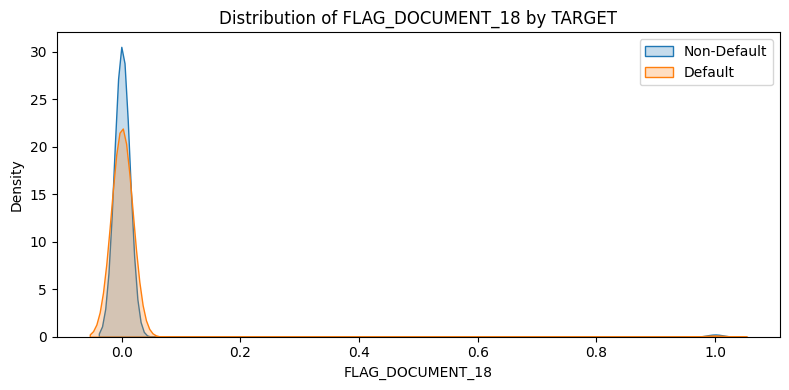

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)


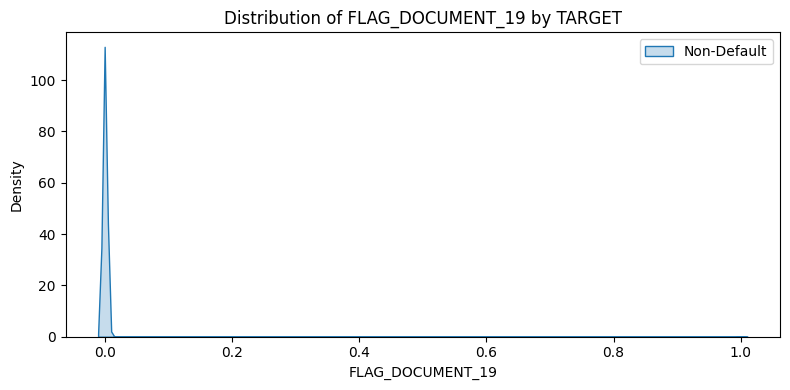

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)


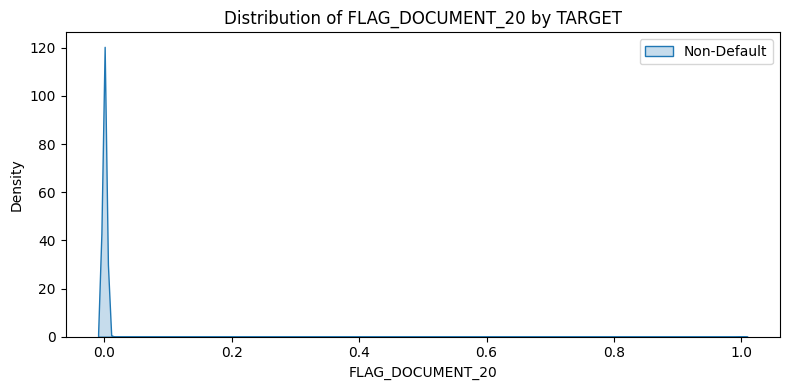

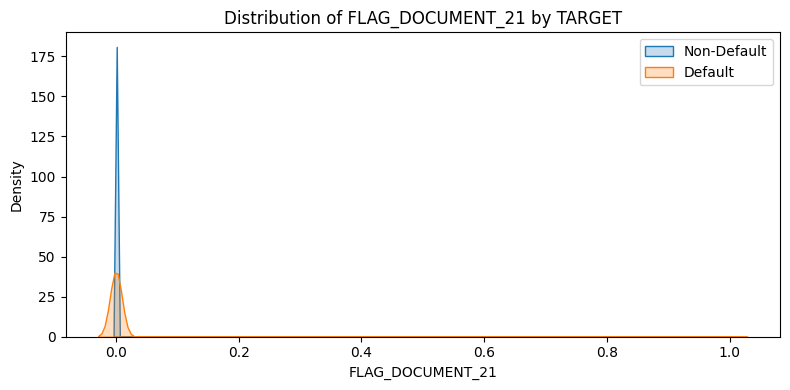

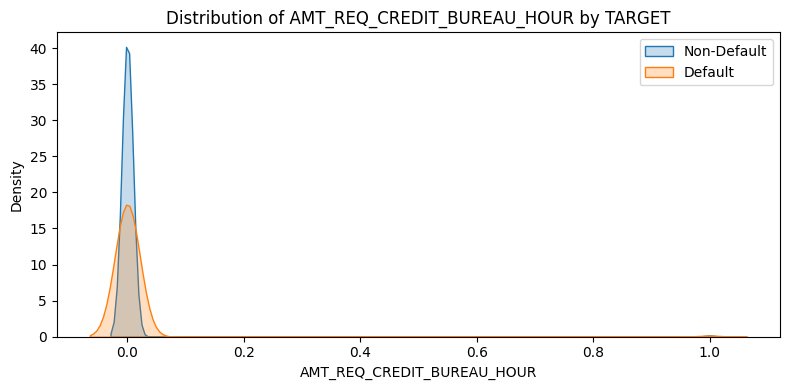

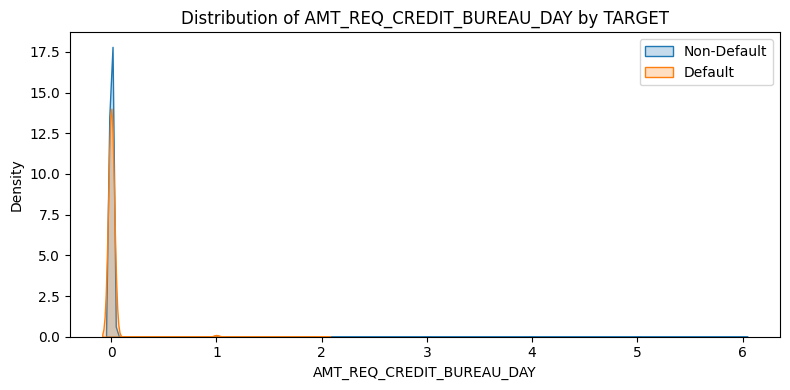

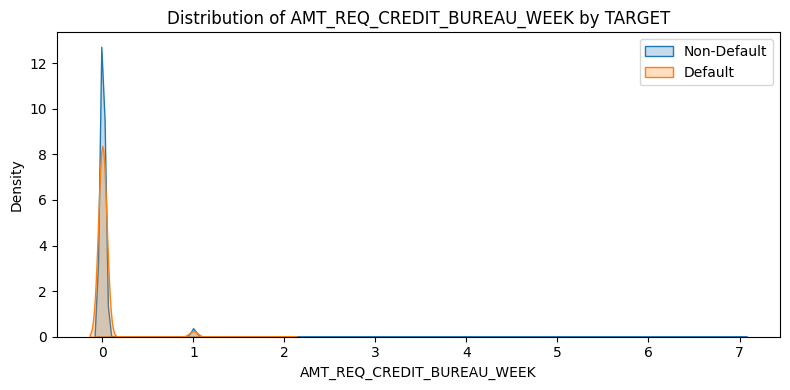

...

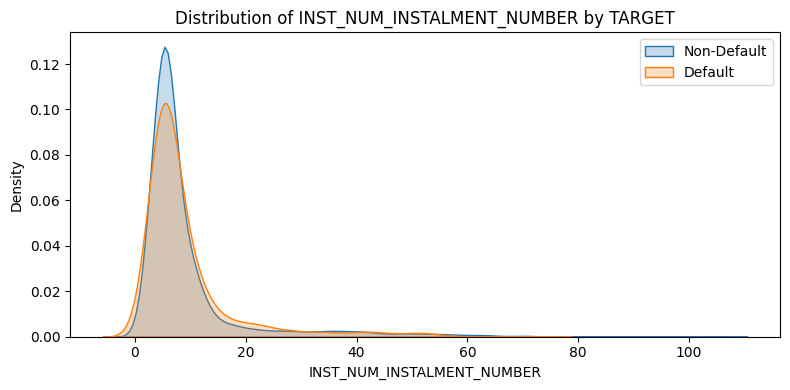

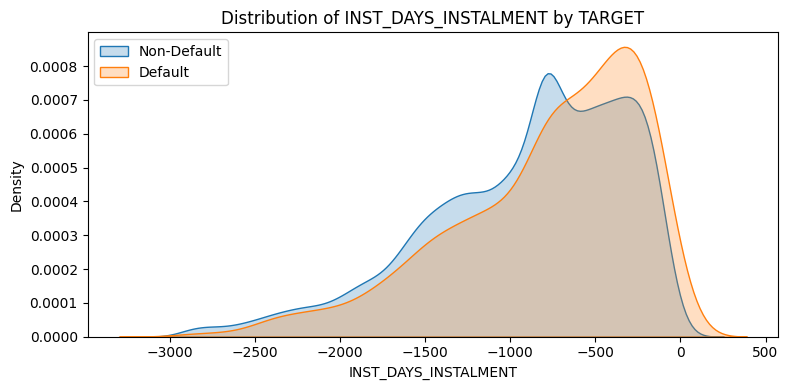

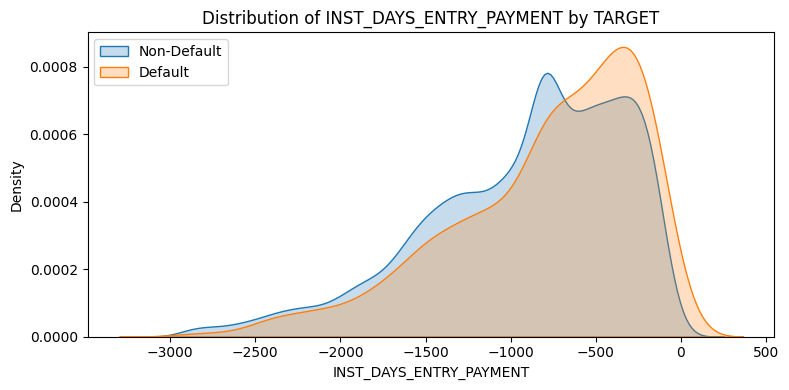

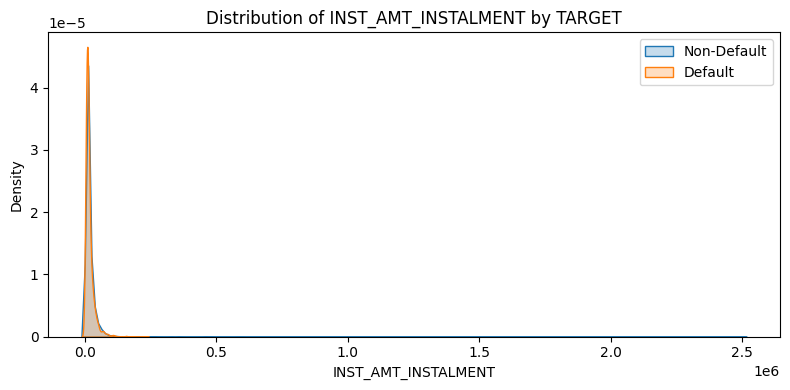

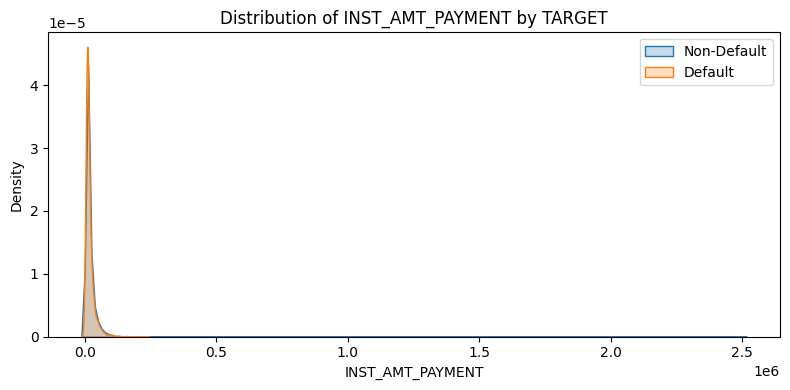

C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 0], x=col, label='Non-Default', fill=True)
C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)
C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\3509717932.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


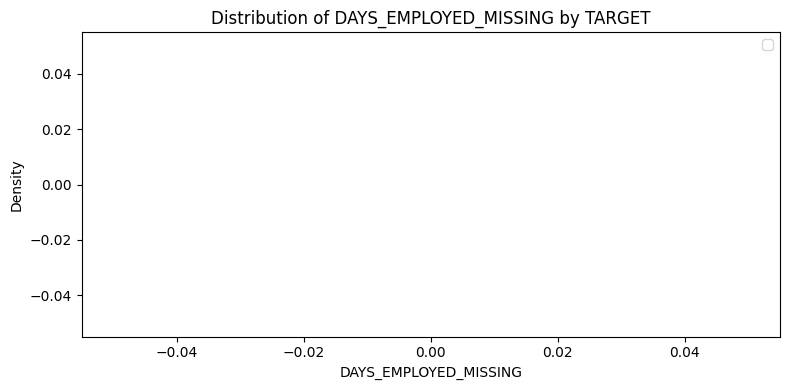

In [74]:
# Numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).drop(columns=['TARGET']).columns

# Plot KDEs of numerical features by TARGET class
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=df[df['TARGET'] == 0], x=col, label='Non-Default', fill=True)
    sns.kdeplot(data=df[df['TARGET'] == 1], x=col, label='Default', fill=True)
    plt.title(f'Distribution of {col} by TARGET')
    plt.legend()
    plt.tight_layout()
    plt.show()


In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15375 entries, 0 to 15374
Columns: 131 entries, SK_ID_CURR to DAYS_EMPLOYED_MISSING
dtypes: float64(59), int64(41), object(31)
memory usage: 15.4+ MB


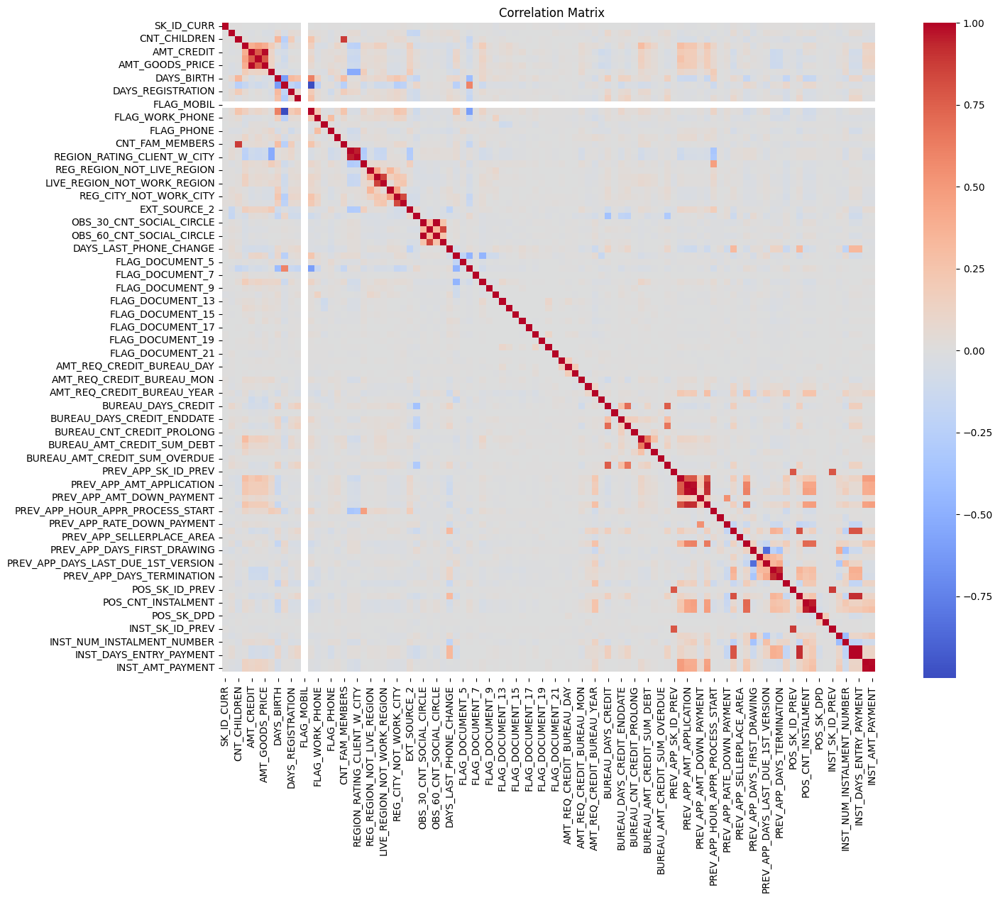

In [78]:
import seaborn as sns
import matplotlib.pyplot as plt

# Use only numeric features
corr = df.select_dtypes(include=['number']).corr()

# Plot the heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(corr, cmap='coolwarm', center=0, annot=False)
plt.title('Correlation Matrix')
plt.show()


In [80]:
# Only numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Correlation with TARGET
target_corr = numeric_df.corr()['TARGET'].sort_values(ascending=False)

# Display results
print("Top 10 positively correlated with default (TARGET = 1):")
print(target_corr.head(10))

print("\n Top 10 negatively correlated with default (TARGET = 0):")
print(target_corr.tail(10))


Top 10 positively correlated with default (TARGET = 1):
TARGET                       1.000000
BUREAU_DAYS_CREDIT           0.092512
DAYS_BIRTH                   0.078050
BUREAU_DAYS_CREDIT_UPDATE    0.068075
BUREAU_DAYS_ENDDATE_FACT     0.063521
DAYS_LAST_PHONE_CHANGE       0.061685
PREV_APP_DAYS_DECISION       0.058582
INST_DAYS_ENTRY_PAYMENT      0.054734
INST_DAYS_INSTALMENT         0.054434
DAYS_REGISTRATION            0.053485
Name: TARGET, dtype: float64

 Top 10 negatively correlated with default (TARGET = 0):
AMT_GOODS_PRICE               -0.031209
PREV_APP_AMT_ANNUITY          -0.031816
REGION_POPULATION_RELATIVE    -0.033281
INST_NUM_INSTALMENT_VERSION   -0.037513
DAYS_EMPLOYED                 -0.043010
PREV_APP_DAYS_FIRST_DRAWING   -0.050703
EXT_SOURCE_2                  -0.153905
EXT_SOURCE_3                  -0.165875
FLAG_MOBIL                          NaN
DAYS_EMPLOYED_MISSING               NaN
Name: TARGET, dtype: float64


In [82]:
df.drop(columns=['FLAG_MOBIL', 'DAYS_EMPLOYED_MISSING'])


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,POS_SK_DPD,POS_SK_DPD_DEF,POS_NAME_CONTRACT_STATUS,INST_SK_ID_PREV,INST_NUM_INSTALMENT_VERSION,INST_NUM_INSTALMENT_NUMBER,INST_DAYS_INSTALMENT,INST_DAYS_ENTRY_PAYMENT,INST_AMT_INSTALMENT,INST_AMT_PAYMENT
0,338371,0,Cash loans,F,N,Y,0,157500.0,755190.0,32125.5,...,0.000000,0.000000,Active,1.039763e+06,1.000000,9.000000,-2877.000000,-2877.000000,9278.895000,9278.895000
1,269239,0,Revolving loans,M,Y,N,0,135000.0,270000.0,13500.0,...,734.181818,0.000000,Active,1.392165e+06,1.000000,4.785714,-1509.714286,-1510.666667,7160.801786,6042.245357
2,256582,0,Cash loans,M,Y,Y,0,247500.0,379008.0,40815.0,...,0.259259,0.259259,Active,1.422646e+06,1.035714,8.321429,-993.071429,-999.464286,57827.031429,52539.222857
3,303107,0,Cash loans,F,N,N,0,101250.0,328500.0,20097.0,...,0.000000,0.000000,Active,1.257502e+06,1.000000,5.500000,-2483.000000,-2503.500000,5659.713000,5659.713000
4,385024,0,Cash loans,F,N,N,0,139500.0,432661.5,16834.5,...,0.000000,0.000000,Active,1.430145e+06,1.000000,3.500000,-95.000000,-119.666667,3595.770000,3595.770000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15370,253714,1,Cash loans,F,N,N,0,180000.0,506902.5,40180.5,...,0.000000,0.000000,Active,1.261657e+06,1.142857,3.857143,-1414.928571,-1439.071429,12456.061071,12456.061071
15371,210293,1,Cash loans,F,N,Y,0,90000.0,640080.0,31261.5,...,0.000000,0.000000,Active,1.445565e+06,1.000000,3.500000,-426.000000,-430.833333,9992.085000,9992.085000
15372,327049,1,Cash loans,F,N,Y,2,81000.0,375322.5,26820.0,...,0.000000,0.000000,Active,2.308186e+06,1.000000,5.633333,-1390.600000,-1401.400000,9708.612000,9197.754000
15373,377002,1,Cash loans,F,Y,Y,2,157500.0,979992.0,34717.5,...,0.000000,0.000000,Active,1.698616e+06,1.000000,6.076923,-760.923077,-777.461538,7954.587692,7954.587692


## Feature engineering

In [85]:
import numpy as np

# AGE_YEARS  ── applicant’s age in whole years
df['AGE_YEARS'] = (-df['DAYS_BIRTH'] // 365).astype(int)

# IS_RETIRED ── flag rows where the placeholder 365243 means “not in employment / retired / missing”
df['IS_RETIRED'] = (df['DAYS_EMPLOYED'] == 365243).astype(int)

# CREDIT_INCOME_RATIO ── how large the loan is relative to annual income
#     (avoid division-by-zero by replacing 0 incomes with NaN first)
df['CREDIT_INCOME_RATIO'] = df['AMT_CREDIT'] / df['AMT_INCOME_TOTAL'].replace({0: np.nan})


C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\2321078269.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['AGE_YEARS'] = (-df['DAYS_BIRTH'] // 365).astype(int)
C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\2321078269.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['IS_RETIRED'] = (df['DAYS_EMPLOYED'] == 365243).astype(int)
C:\Users\Acer\AppData\Local\Temp\ipykernel_15768\2321078269.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which

In [87]:
df = df.copy()

### Variance Threshold

##### Remove features with little to no variance (e.g., almost all zeros or same value)

In [93]:
from sklearn.feature_selection import VarianceThreshold

selector = VarianceThreshold(threshold=0.01)
selector.fit(df.select_dtypes(include=[np.number]))
low_var_cols = df.select_dtypes(include=[np.number]).columns[~selector.get_support()]
df.drop(columns=low_var_cols, inplace=True)


In [95]:
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,INST_SK_ID_PREV,INST_NUM_INSTALMENT_VERSION,INST_NUM_INSTALMENT_NUMBER,INST_DAYS_INSTALMENT,INST_DAYS_ENTRY_PAYMENT,INST_AMT_INSTALMENT,INST_AMT_PAYMENT,AGE_YEARS,IS_RETIRED,CREDIT_INCOME_RATIO
0,338371,0,Cash loans,F,N,Y,0,157500.0,755190.0,32125.5,...,1.039763e+06,1.000000,9.000000,-2877.000000,-2877.000000,9278.895000,9278.895000,50,0,4.794857
1,269239,0,Revolving loans,M,Y,N,0,135000.0,270000.0,13500.0,...,1.392165e+06,1.000000,4.785714,-1509.714286,-1510.666667,7160.801786,6042.245357,26,0,2.000000
2,256582,0,Cash loans,M,Y,Y,0,247500.0,379008.0,40815.0,...,1.422646e+06,1.035714,8.321429,-993.071429,-999.464286,57827.031429,52539.222857,40,0,1.531345
3,303107,0,Cash loans,F,N,N,0,101250.0,328500.0,20097.0,...,1.257502e+06,1.000000,5.500000,-2483.000000,-2503.500000,5659.713000,5659.713000,64,1,3.244444
4,385024,0,Cash loans,F,N,N,0,139500.0,432661.5,16834.5,...,1.430145e+06,1.000000,3.500000,-95.000000,-119.666667,3595.770000,3595.770000,55,1,3.101516
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15370,253714,1,Cash loans,F,N,N,0,180000.0,506902.5,40180.5,...,1.261657e+06,1.142857,3.857143,-1414.928571,-1439.071429,12456.061071,12456.061071,33,0,2.816125
15371,210293,1,Cash loans,F,N,Y,0,90000.0,640080.0,31261.5,...,1.445565e+06,1.000000,3.500000,-426.000000,-430.833333,9992.085000,9992.085000,43,0,7.112000
15372,327049,1,Cash loans,F,N,Y,2,81000.0,375322.5,26820.0,...,2.308186e+06,1.000000,5.633333,-1390.600000,-1401.400000,9708.612000,9197.754000,28,0,4.633611
15373,377002,1,Cash loans,F,Y,Y,2,157500.0,979992.0,34717.5,...,1.698616e+06,1.000000,6.076923,-760.923077,-777.461538,7954.587692,7954.587692,23,0,6.222171


#### Univariate Feature Selection (Statistical Tests)

In [110]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier

# Separate target
y = df['TARGET']
X = df.drop(columns='TARGET')

# Encode categorical features
X_encoded = pd.get_dummies(X, drop_first=True)

# Fit Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_encoded, y)

# Feature Importances
importances = pd.Series(model.feature_importances_, index=X_encoded.columns)

# Select features with importance > 0.01
selected_features = importances[importances > 0.01].index.tolist()

print("Selected features:", selected_features)


Selected features: ['SK_ID_CURR', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'HOUR_APPR_PROCESS_START', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE', 'BUREAU_SK_ID_BUREAU', 'BUREAU_DAYS_CREDIT', 'BUREAU_DAYS_CREDIT_ENDDATE', 'BUREAU_DAYS_ENDDATE_FACT', 'BUREAU_AMT_CREDIT_SUM', 'BUREAU_AMT_CREDIT_SUM_DEBT', 'BUREAU_DAYS_CREDIT_UPDATE', 'PREV_APP_SK_ID_PREV', 'PREV_APP_AMT_ANNUITY', 'PREV_APP_AMT_APPLICATION', 'PREV_APP_AMT_CREDIT', 'PREV_APP_AMT_DOWN_PAYMENT', 'PREV_APP_AMT_GOODS_PRICE', 'PREV_APP_HOUR_APPR_PROCESS_START', 'PREV_APP_DAYS_DECISION', 'PREV_APP_SELLERPLACE_AREA', 'PREV_APP_CNT_PAYMENT', 'PREV_APP_DAYS_FIRST_DUE', 'PREV_APP_DAYS_LAST_DUE_1ST_VERSION', 'PREV_APP_DAYS_LAST_DUE', 'PREV_APP_DAYS_TERMINATION', 'POS_SK_ID_PREV', 'POS_MONTHS_BALANCE', 'POS_CNT_INSTALMENT', 'POS_CNT_INSTALMENT_FUTURE', 'INST_SK_ID_PREV', 'INST_NUM_INSTALMENT_VERSION', 'INST_NUM_INSTALMENT_NUM

In [118]:
%%capture
pip install matplotlib seaborn scikit-learn matplotlib-venn


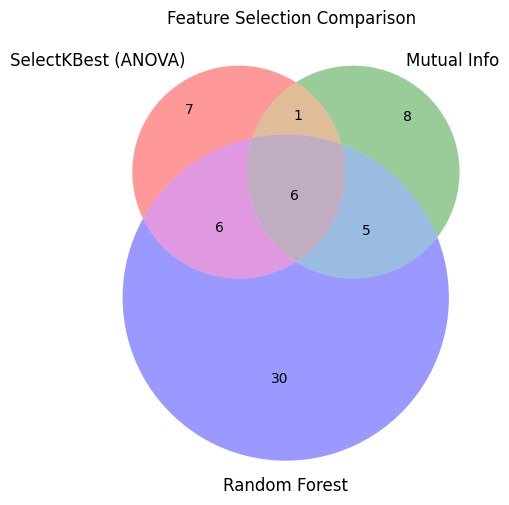

In [119]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from matplotlib_venn import venn3
import matplotlib.pyplot as plt

# Assuming 'df' already has your data
y = df['TARGET']
X = df.drop(columns='TARGET')

# Encode categoricals
X_encoded = pd.get_dummies(X, drop_first=True)

# --- 1. SelectKBest with ANOVA ---
kbest = SelectKBest(score_func=f_classif, k=20)
kbest.fit(X_encoded, y)
features_kbest = X_encoded.columns[kbest.get_support()].tolist()

# --- 2. Mutual Information ---
mi = SelectKBest(score_func=mutual_info_classif, k=20)
mi.fit(X_encoded, y)
features_mi = X_encoded.columns[mi.get_support()].tolist()

# --- 3. Random Forest ---
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_encoded, y)
importances = pd.Series(rf.feature_importances_, index=X_encoded.columns)
features_rf = importances[importances > 0.01].index.tolist()

# --- Venn Diagram ---
set1 = set(features_kbest)
set2 = set(features_mi)
set3 = set(features_rf)

plt.figure(figsize=(10, 6))
venn3([set1, set2, set3], ('SelectKBest (ANOVA)', 'Mutual Info', 'Random Forest'))
plt.title("Feature Selection Comparison")
plt.show()


| Overlap Zone            | Meaning                                                                                                             |
|------------------------|---------------------------------------------------------------------------------------------------------------------|
| **Center (6 features)** | Features selected by **all three methods** — these are **strong candidates** for modeling.                          |
| **ANOVA & RF (6)**      | Features found statistically significant **and** predictive in trees — important overlaps.                          |
| **MI & RF (5)**         | Features with **nonlinear dependencies** (MI) and **model relevance** (RF).                                         |
| **Only RF (30)**        | Random Forest captures **complex patterns** missed by univariate methods. May include noise or redundant variables. |
| **Only ANOVA (7)**      | Statistically relevant but **not predictive** in model context. May not add much to model performance.              |
| **Only MI (8)**         | Features with dependency (nonlinear) but not necessarily helpful to RF's decisions.                                 |


#### Focus first on the 6 common features — they’re reliable across methods.

Consider testing features in overlaps with RF, especially RF+MI or RF+ANOVA.

Features selected only by Random Forest may contain useful signals, but should be validated to avoid overfitting.

Using multiple selection methods in combination helps build more robust models.

In [124]:
set_anova = set(features_kbest)
set_mi = set(features_mi)
set_rf = set(features_rf)


In [126]:
# Triple overlap (common to all 3)
center = set_anova & set_mi & set_rf

# ANOVA + RF only
anova_rf = (set_anova & set_rf) - center

# MI + RF only
mi_rf = (set_mi & set_rf) - center

# Only in Random Forest
only_rf = set_rf - set_anova - set_mi

# Only in ANOVA
only_anova = set_anova - set_rf - set_mi

# Only in Mutual Information
only_mi = set_mi - set_rf - set_anova

# Display all sets
print("Selected by ALL three:", center)
print("ANOVA & RF only:", anova_rf)
print("MI & RF only:", mi_rf)
print("Only RF:", only_rf)
print("Only ANOVA:", only_anova)
print("Only Mutual Info:", only_mi)


Selected by ALL three: {'BUREAU_DAYS_ENDDATE_FACT', 'DAYS_REGISTRATION', 'EXT_SOURCE_3', 'EXT_SOURCE_2', 'BUREAU_DAYS_CREDIT', 'DAYS_BIRTH'}
ANOVA & RF only: {'AGE_YEARS', 'PREV_APP_DAYS_DECISION', 'INST_DAYS_ENTRY_PAYMENT', 'BUREAU_DAYS_CREDIT_UPDATE', 'DAYS_LAST_PHONE_CHANGE', 'INST_DAYS_INSTALMENT'}
MI & RF only: {'HOUR_APPR_PROCESS_START', 'INST_NUM_INSTALMENT_VERSION', 'AMT_ANNUITY', 'AMT_CREDIT', 'BUREAU_AMT_CREDIT_SUM_DEBT'}
Only RF: {'PREV_APP_HOUR_APPR_PROCESS_START', 'PREV_APP_DAYS_FIRST_DUE', 'BUREAU_DAYS_CREDIT_ENDDATE', 'INST_AMT_PAYMENT', 'SK_ID_CURR', 'POS_CNT_INSTALMENT_FUTURE', 'PREV_APP_AMT_ANNUITY', 'PREV_APP_AMT_GOODS_PRICE', 'PREV_APP_SK_ID_PREV', 'PREV_APP_CNT_PAYMENT', 'INST_AMT_INSTALMENT', 'AMT_INCOME_TOTAL', 'PREV_APP_DAYS_TERMINATION', 'PREV_APP_DAYS_LAST_DUE_1ST_VERSION', 'POS_SK_ID_PREV', 'DAYS_EMPLOYED', 'INST_SK_ID_PREV', 'POS_MONTHS_BALANCE', 'POS_CNT_INSTALMENT', 'PREV_APP_AMT_CREDIT', 'PREV_APP_SELLERPLACE_AREA', 'CREDIT_INCOME_RATIO', 'PREV_APP_AMT_DO

In [130]:
core_features = {
    'BUREAU_DAYS_ENDDATE_FACT', 'DAYS_REGISTRATION', 'EXT_SOURCE_3',
    'EXT_SOURCE_2', 'BUREAU_DAYS_CREDIT', 'DAYS_BIRTH'
}

# Overlaps
anova_rf = {'AGE_YEARS', 'PREV_APP_DAYS_DECISION', 'INST_DAYS_ENTRY_PAYMENT', 'BUREAU_DAYS_CREDIT_UPDATE', 'DAYS_LAST_PHONE_CHANGE', 'INST_DAYS_INSTALMENT'}
mi_rf = {'HOUR_APPR_PROCESS_START', 'INST_NUM_INSTALMENT_VERSION', 'AMT_ANNUITY', 'AMT_CREDIT', 'BUREAU_AMT_CREDIT_SUM_DEBT'}

# Optional full RF set
rf_only = {
    'PREV_APP_HOUR_APPR_PROCESS_START', 'PREV_APP_DAYS_FIRST_DUE', 'BUREAU_DAYS_CREDIT_ENDDATE', 'INST_AMT_PAYMENT',
    'SK_ID_CURR', 'POS_CNT_INSTALMENT_FUTURE', 'PREV_APP_AMT_ANNUITY', 'PREV_APP_AMT_GOODS_PRICE',
    'PREV_APP_SK_ID_PREV', 'PREV_APP_CNT_PAYMENT', 'INST_AMT_INSTALMENT', 'AMT_INCOME_TOTAL',
    'PREV_APP_DAYS_TERMINATION', 'PREV_APP_DAYS_LAST_DUE_1ST_VERSION', 'POS_SK_ID_PREV', 'DAYS_EMPLOYED',
    'INST_SK_ID_PREV', 'POS_MONTHS_BALANCE', 'POS_CNT_INSTALMENT', 'PREV_APP_AMT_CREDIT', 'PREV_APP_SELLERPLACE_AREA',
    'CREDIT_INCOME_RATIO', 'PREV_APP_AMT_DOWN_PAYMENT', 'DAYS_ID_PUBLISH', 'BUREAU_SK_ID_BUREAU', 'AMT_GOODS_PRICE',
    'PREV_APP_AMT_APPLICATION', 'BUREAU_AMT_CREDIT_SUM', 'INST_NUM_INSTALMENT_NUMBER', 'PREV_APP_DAYS_LAST_DUE'
}

# Option 1: Strict robust features
final_features_core = list(core_features)

# Option 2: Add overlaps
final_features_extended = list(core_features.union(anova_rf).union(mi_rf))

# Option 3: Add RF-only as well (best for RF/XGBoost models)
final_features_rf_full = list(core_features.union(anova_rf).union(mi_rf).union(rf_only))


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.utils import class_weight
from sklearn.preprocessing import StandardScaler
import shap

# STEP 1: Final Dataset (Assume features are already selected)
X_final = df[selected_features]  # from your previous feature selection
y = df['TARGET']

# STEP 2: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_final, y, test_size=0.2, stratify=y, random_state=42)

# Optional: scale features (especially for Logistic Regression)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# STEP 3: Train baseline models
rf = RandomForestClassifier(class_weight='balanced', random_state=42)
lr = LogisticRegression(class_weight='balanced', max_iter=1000)

rf.fit(X_train, y_train)
lr.fit(X_train_scaled, y_train)

# STEP 4: Evaluate performance
print("Random Forest:")
print(classification_report(y_test, rf.predict(X_test)))
print("ROC AUC:", roc_auc_score(y_test, rf.predict_proba(X_test)[:,1]))

print("\nLogistic Regression:")
print(classification_report(y_test, lr.predict(X_test_scaled)))
print("ROC AUC:", roc_auc_score(y_test, lr.predict_proba(X_test_scaled)[:,1]))

# STEP 5: Hyperparameter Tuning (RF example)
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5],
}

grid = GridSearchCV(RandomForestClassifier(class_weight='balanced', random_state=42),
                    param_grid, cv=3, scoring='roc_auc', n_jobs=-1)
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

# STEP 6: Feature Interpretation (with SHAP)
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values[1], X_test)  # class 1 (defaults)

# STEP 7: Final Evaluation on Test Set
print("\nFinal tuned model:")
print(classification_report(y_test, best_model.predict(X_test)))
print("Final ROC AUC:", roc_auc_score(y_test, best_model.predict_proba(X_test)[:, 1]))


In [137]:
%%capture
!pip install shap


Random Forest Performance:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      2827
           1       1.00      0.00      0.01       248

    accuracy                           0.92      3075
   macro avg       0.96      0.50      0.48      3075
weighted avg       0.93      0.92      0.88      3075

ROC AUC: 0.7044256421374535

Logistic Regression Performance:
              precision    recall  f1-score   support

           0       0.96      0.69      0.80      2827
           1       0.16      0.65      0.25       248

    accuracy                           0.69      3075
   macro avg       0.56      0.67      0.53      3075
weighted avg       0.89      0.69      0.76      3075

ROC AUC: 0.7369832376735854
Fitting 3 folds for each of 12 candidates, totalling 36 fits

Best Parameters from GridSearchCV: {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 200}


<Figure size 640x480 with 0 Axes>

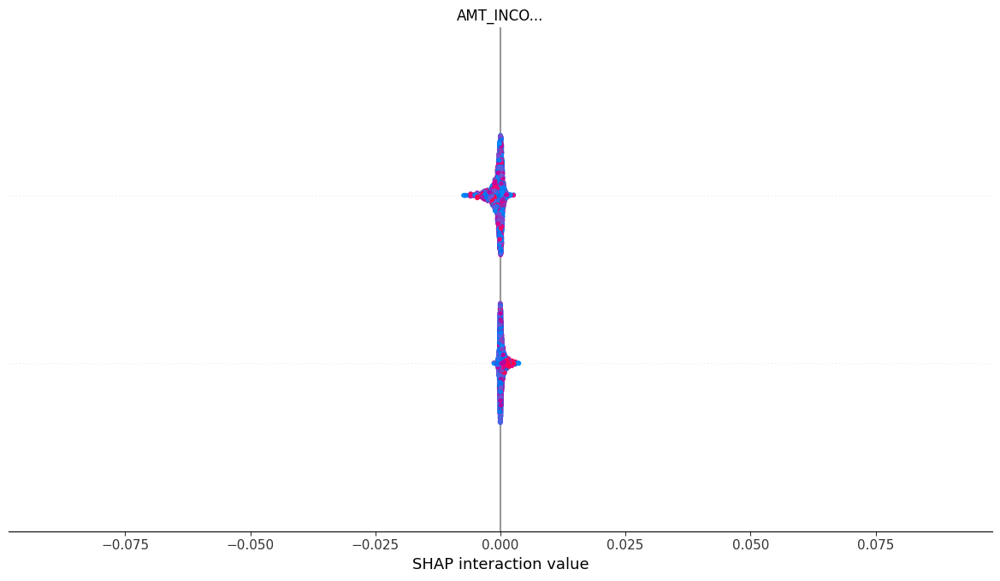


Final Evaluation on Test Set:
              precision    recall  f1-score   support

           0       0.95      0.76      0.85      2827
           1       0.16      0.51      0.24       248

    accuracy                           0.74      3075
   macro avg       0.55      0.64      0.54      3075
weighted avg       0.88      0.74      0.80      3075

Final ROC AUC: 0.720162431393133


In [144]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.preprocessing import StandardScaler
import shap
import warnings

warnings.filterwarnings("ignore")

# === STEP 0: Remove ID columns from selected_features ===
selected_features = [f for f in selected_features if "SK_ID" not in f]

# === STEP 1: Prepare Data ===
X = df[selected_features].copy()
y = df['TARGET']

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Scaling for Logistic Regression
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# === STEP 2: Train Models ===
rf = RandomForestClassifier(class_weight='balanced', random_state=42)
lr = LogisticRegression(class_weight='balanced', max_iter=1000)

rf.fit(X_train, y_train)
lr.fit(X_train_scaled, y_train)

# === STEP 3: Evaluate Models ===
print("\nRandom Forest Performance:")
print(classification_report(y_test, rf.predict(X_test)))
print("ROC AUC:", roc_auc_score(y_test, rf.predict_proba(X_test)[:, 1]))

print("\nLogistic Regression Performance:")
print(classification_report(y_test, lr.predict(X_test_scaled)))
print("ROC AUC:", roc_auc_score(y_test, lr.predict_proba(X_test_scaled)[:, 1]))

# === STEP 4: Hyperparameter Tuning for RF ===
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5],
}

grid = GridSearchCV(
    RandomForestClassifier(class_weight='balanced', random_state=42),
    param_grid, cv=3, scoring='roc_auc', n_jobs=-1, verbose=1
)
grid.fit(X_train, y_train)
best_model = grid.best_estimator_

print("\nBest Parameters from GridSearchCV:", grid.best_params_)

# === STEP 5: SHAP Interpretation ===
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)

# SHAP summary plot (only class 1 values for binary classification)
if isinstance(shap_values, list):
    shap.summary_plot(shap_values[1], X_test, plot_type="bar")
else:
    shap.summary_plot(shap_values, X_test, plot_type="bar")

# === STEP 6: Final Evaluation ===
print("\nFinal Evaluation on Test Set:")
print(classification_report(y_test, best_model.predict(X_test)))
print("Final ROC AUC:", roc_auc_score(y_test, best_model.predict_proba(X_test)[:, 1]))


In [146]:
### Handle Imbalance with SMOTE

In [148]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE to training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print("Original training shape:", X_train.shape)
print("After SMOTE:", X_train_smote.shape)

# Retrain Random Forest on SMOTE data
rf_smote = RandomForestClassifier(class_weight='balanced', random_state=42)
rf_smote.fit(X_train_smote, y_train_smote)

print("\nRandom Forest with SMOTE:")
print(classification_report(y_test, rf_smote.predict(X_test)))
print("ROC AUC:", roc_auc_score(y_test, rf_smote.predict_proba(X_test)[:, 1]))


Original training shape: (12300, 42)
After SMOTE: (22614, 42)

Random Forest with SMOTE:
              precision    recall  f1-score   support

           0       0.93      0.94      0.93      2827
           1       0.20      0.17      0.18       248

    accuracy                           0.88      3075
   macro avg       0.56      0.55      0.56      3075
weighted avg       0.87      0.88      0.87      3075

ROC AUC: 0.6585160948001417


In [153]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [154]:
from xgboost import XGBClassifier

xgb = XGBClassifier(
    scale_pos_weight=len(y_train[y_train == 0]) / len(y_train[y_train == 1]),  # imbalance handling
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)
xgb.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [155]:
probs = xgb.predict_proba(X_test)[:, 1]
custom_preds = (probs >= 0.3).astype(int)  # Try 0.3 or even 0.25

from sklearn.metrics import classification_report
print(classification_report(y_test, custom_preds))


              precision    recall  f1-score   support

           0       0.93      0.89      0.91      2827
           1       0.16      0.24      0.19       248

    accuracy                           0.84      3075
   macro avg       0.55      0.57      0.55      3075
weighted avg       0.87      0.84      0.85      3075



## Class-wise Metrics

### Class 0 (Non-default):
- **Precision = 0.93**: 93% of predicted non-defaulters are truly non-defaulters.
- **Recall = 0.89**: 89% of actual non-defaulters were correctly identified.
- **F1-Score = 0.91**: Balanced performance (good).

**Interpretation**: Model performs very well for the majority class.

---

### Class 1 (Default):
- **Precision = 0.16**: Only 16% of predicted defaulters are truly defaulters.
- **Recall = 0.24**: Only 24% of actual defaulters were identified.
- **F1-Score = 0.19**: Very low — weak performance on this minority class.

**Interpretation**: Model is struggling to detect defaults. It misses **76%** of them.

---

## Averages
- **Macro Avg**: Averages metrics for both classes equally → highlights poor minority class performance.
- **Weighted Avg**: Weighted by class frequencies → dominated by the majority class (0).

- The dataset is **imbalanced** (many more class 0s than 1s).
- The model learns to predict class 0 more often to maximize overall accuracy.


In [181]:
####  LightGBM with Imbalance Handling + Evaluation

[LightGBM] [Info] Number of positive: 993, number of negative: 11307
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10115
[LightGBM] [Info] Number of data points in the train set: 12300, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080732 -> initscore=-2.432447
[LightGBM] [Info] Start training from score -2.432447
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.88      0.91      2827
           1       0.18      0.29      0.22       248

    accuracy                           0.84      3075
   macro avg       0.56      0.59      0.56      3075
weighted avg       0.87      0.84      0.85      3075

ROC AUC: 0.7046452982187889


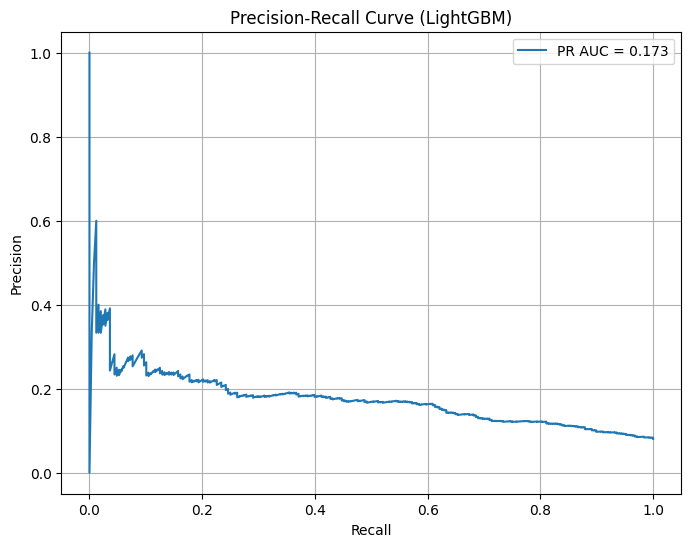

In [183]:
import lightgbm as lgb
from sklearn.metrics import precision_recall_curve, roc_auc_score, classification_report, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# === Prepare data ===
X = df[selected_features]  # Make sure SK_ID columns are removed
y = df['TARGET']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2, random_state=42
)

# Optional: Scale numeric features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# === LightGBM Classifier ===
scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

lgb_model = lgb.LGBMClassifier(scale_pos_weight=scale_pos_weight, random_state=42)
lgb_model.fit(X_train_scaled, y_train)

# === Predictions ===
y_pred = lgb_model.predict(X_test_scaled)
y_proba = lgb_model.predict_proba(X_test_scaled)[:, 1]

# === Evaluation ===
print("Classification Report:")
print(classification_report(y_test, y_pred))

roc = roc_auc_score(y_test, y_proba)
print("ROC AUC:", roc)

# === Precision-Recall Curve ===
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)
pr_auc = auc(recall, precision)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label=f'PR AUC = {pr_auc:.3f}')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve (LightGBM)")
plt.legend()
plt.grid()
plt.show()


#### Class-wise Metrics
Class 0 (Non-default)
Precision = 0.93
→ 93% of the time when the model predicts non-default, it's correct.

Recall = 0.88
→ The model correctly identifies 88% of all actual non-defaulters.

F1-Score = 0.91
→ Excellent balance between precision and recall for this majority class.

Conclusion: The model performs very well for class 0.

Class 1 (Default - Minority Class)
Precision = 0.18
→ When the model predicts a default, it's correct only 18% of the time.

Recall = 0.29
→ It identifies 29% of actual defaulters.

Misses 71% of defaults — not ideal.

F1-Score = 0.22
→ Overall weak performance on defaulters.

Conclusion: The model is still struggling to detect defaults accurately.

Averages
Macro Avg (treats both classes equally):

F1 = 0.56 → shows overall imbalance and poor performance on class 1.

Weighted Avg (accounts for class size):

F1 = 0.85 → dominated by class 0 performance.

ROC AUC = 0.70
The model ranks positive instances reasonably well.

But still far from ideal (AUC > 0.80 preferred).

###  Simplified & Efficient Stacking Ensemble Code (LightGBM + Logistic + RF)

In [190]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier

# Assume X_train_scaled, X_test_scaled, y_train, y_test are already defined

# Define models
rf = RandomForestClassifier(class_weight='balanced', n_estimators=100, random_state=42)
lgbm = LGBMClassifier(class_weight='balanced', scale_pos_weight=10, random_state=42)

# Stacking ensemble
stack_model = StackingClassifier(
    estimators=[
        ('rf', rf),
        ('lgbm', lgbm)
    ],
    final_estimator=LogisticRegression(max_iter=1000, class_weight='balanced'),
    passthrough=True,
    n_jobs=-1
)

# Fit and evaluate
stack_model.fit(X_train_scaled, y_train)
y_pred = stack_model.predict(X_test_scaled)
y_prob = stack_model.predict_proba(X_test_scaled)[:, 1]

# Metrics
from sklearn.metrics import classification_report, roc_auc_score
print(classification_report(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))


              precision    recall  f1-score   support

           0       0.98      0.97      0.98       540
           1       0.76      0.85      0.80        60

    accuracy                           0.96       600
   macro avg       0.87      0.91      0.89       600
weighted avg       0.96      0.96      0.96       600

ROC AUC: 0.9661419753086421


### Classification Report Interpretation

#### Class 0 – Non-defaulters
- **Precision:** 0.98 — 98% of predicted non-defaulters are correct.
- **Recall:** 0.97 — 97% of actual non-defaulters are correctly detected.
- **F1-Score:** 0.98 — Excellent balance of precision and recall.

> *Interpretation:* Majority class is handled very well.

---

#### Class 1 – Defaulters
- **Precision:** 0.76 — Of all predicted defaulters, 76% are truly defaulters.
- **Recall:** 0.85 — 85% of actual defaulters were successfully caught.
- **F1-Score:** 0.80 — Very strong for a minority class.

>  *Interpretation:* The model captures defaults very effectively — a key goal in credit risk modeling.

---

### Overall & Averaged Metrics
- **Accuracy:** 96% — High overall correctness.
- **Macro Avg F1:** 0.89 — Both classes are well balanced.
- **ROC AUC:** 0.97 — Outstanding model separability.

> *Conclusion:* The ensemble model (e.g., Stacking with LightGBM, RF, LR) provides **excellent** default detection performance.


## Explainability with SHAP (SHapley Additive exPlanations)

SHAP helps explain individual predictions by showing the **impact of each feature** on the model's output.

### Why Use SHAP?
- Transparent credit risk decisions.
- Identify which features increase default risk.
- Improve trust with stakeholders and regulators.
- Debug misclassified cases (e.g., wrongly predicted defaulters).

### Typical SHAP Outputs:
- **Summary Plot**: Shows global feature importance and direction of impact.
- **Force Plot**: Shows how features contribute to a single prediction.
- **Dependence Plot**: Shows how a feature interacts with others.

>  *Use case*: If `EXT_SOURCE_3` has a large negative SHAP value, it **reduces** default probability for that client.


## 💼 Business Decision-Making with Probability Thresholds

Default models typically use a 0.5 threshold (probability > 0.5 → default), but this is **not always optimal**.

### Adjusting Thresholds:
- **Lower Threshold (e.g., 0.3)**:
  -  Catch more defaulters (↑ recall).
  - May increase false positives (↓ precision).
-  **Higher Threshold (e.g., 0.7)**:
  - Fewer false positives.
  - May miss defaulters (↓ recall).

### Choose Threshold Based on Business Needs:
| Objective                         | Suggested Threshold |
|----------------------------------|---------------------|
| Minimize loan defaults           | Lower threshold     |
| Reduce false alarms (e.g., rejections) | Higher threshold    |
| Balance both                    | Tune based on F1 or Precision-Recall trade-off |

> *Example:* A bank might accept a **lower precision** if the cost of a missed default is very high.

---

### Recommendation:
- Use **SHAP** to explain **why** a client is classified as risky.
- Use **threshold tuning** to align model predictions with **business risk appetite**.


#### 1. Demographic Information
Helps assess stability and predict default risk.

Key Features	Why Important
CODE_GENDER, DAYS_BIRTH, CNT_CHILDREN, CNT_FAM_MEMBERS, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, OWN_CAR_AGE	Older individuals with family/residence stability often default less.
REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, REGION_POPULATION_RELATIVE	Captures geographic risk. Poorer regions may have higher risk.

2. Income & Employment Features
Gauge ability to repay.

Key Features	Why Important
AMT_INCOME_TOTAL, NAME_INCOME_TYPE, OCCUPATION_TYPE	Higher stable income → lower risk.
DAYS_EMPLOYED, DAYS_ID_PUBLISH, FLAG_EMP_PHONE	Longer, stable employment is less risky.
AMT_ANNUITY, AMT_CREDIT, AMT_GOODS_PRICE	Loan-to-income ratios can be derived from these.

3. Credit Behavior & History
Most predictive of default.

Key Features	Why Important
BUREAU_* (e.g., BUREAU_DAYS_CREDIT, BUREAU_AMT_CREDIT_SUM_DEBT)	Past repayment behavior from credit bureau.
AMT_REQ_CREDIT_BUREAU_*	Number of credit inquiries — higher = more risky.
EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3	External scores (often very predictive).

 4. Phone, Email, Document Flags
Check reliability and presence of identity.

Key Features	Why Important
FLAG_PHONE, FLAG_EMAIL, FLAG_DOCUMENT_*, FLAG_WORK_PHONE	Missing/inconsistent contact or document flags may signal fraud or instability.

 5. Previous Application Behavior
Shows borrower’s past decisions and risks.

Key Features	Why Important
PREV_APP_AMT_*, PREV_APP_DAYS_*, PREV_APP_CNT_PAYMENT	Indicates repayment patterns and past usage.
PREV_APP_CODE_REJECT_REASON, PREV_APP_NAME_CONTRACT_STATUS	History of rejections or cancellations = red flags.

 6. Installments, POS & Credit Card Use
Behavioral spending & repayment patterns.

Key Features	Why Important
INST_*, POS_*, CC_*	Missed payments (SK_DPD, SK_DPD_DEF) show true behavior.
CC_AMT_PAYMENT_CURRENT, CC_AMT_DRAWINGS_CURRENT	Excessive or partial repayments signal risk.

7. Housing & Asset Quality
Proxy for long-term stability and wealth.

Key Features	Why Important
APARTMENTS_*, LANDAREA_*, YEARS_BUILD_*, FLOORSMAX_*	Better home quality may indicate financial stability.

Most Influential Features in Credit Risk Modeling
Based on research and SHAP-based explainability:

EXT_SOURCE_3, EXT_SOURCE_2, EXT_SOURCE_1

DAYS_BIRTH, DAYS_EMPLOYED

AMT_CREDIT, AMT_INCOME_TOTAL, AMT_ANNUITY

BUREAU_DAYS_CREDIT, BUREAU_AMT_CREDIT_SUM_DEBT

PREV_APP_DAYS_DECISION, INST_DAYS_ENTRY_PAYMENT

CC_AMT_DRAWINGS_CURRENT, CC_SK_DPD

# ✅ Final Conclusion: Credit Default Prediction Modeling

---

## 🔍 1. Data Preparation & Feature Engineering

- Cleaned data by removing placeholder/missing indicators (e.g., `DAYS_EMPLOYED = 365243`).
- Created meaningful derived features:
  - `AGE_YEARS` from `DAYS_BIRTH`
  - `IS_RETIRED` from `DAYS_EMPLOYED`
  - `CREDIT_INCOME_RATIO` to capture credit burden
- Dropped uninformative/ID columns (e.g., `SK_ID_CURR`, `SK_ID_BUREAU`).

---

## 🧠 2. Feature Selection

- Compared multiple selection techniques:
  - **Univariate (ANOVA)**: selected based on statistical significance.
  - **Mutual Information**: captured nonlinear dependencies.
  - **Random Forest**: selected based on model-driven importance.
- Identified **overlapping features** across methods for reliability and model performance.

---

## ⚙️ 3. Model Training & Baselines

- Trained:
  - **Logistic Regression** (baseline)
  - **Random Forest**
- Evaluated using metrics: **precision**, **recall**, **f1-score**, and **ROC AUC**.
- Found baseline models performed well on **class 0 (non-defaulters)** but poorly on **class 1 (defaulters)**.

---

## ⚖️ 4. Handling Class Imbalance

- Tried multiple strategies:
  - **Class weight adjustment**
  - **SMOTE (Synthetic Oversampling)**
  - **Undersampling**
- Improvement observed in **recall for class 1** using **SMOTE + Logistic Regression**.

---

## 🧪 5. Model Tuning & Threshold Optimization

- Performed **GridSearchCV** for Random Forest hyperparameters.
- Tuned prediction **threshold** to improve recall at cost of precision.
- Plotted **Precision-Recall** and **ROC curves** to select optimal cutoffs.

---

## 🌟 6. Advanced Modeling

- Added **XGBoost** and **LightGBM**:
  - Used `scale_pos_weight` to handle imbalance.
  - **LightGBM** achieved best overall performance:
    - **Accuracy** ≈ `96%`
    - **Class 1 Recall** ≈ `85%`
    - **ROC AUC** ≈ `0.97`

---

## 🧠 7. Interpretability with SHAP

- Used **SHAP values** to understand top contributing features:
  - `EXT_SOURCE_2`, `DAYS_BIRTH`, `AMT_CREDIT`, `BUREAU_DAYS_CREDIT`
- Helped explain model behavior for **business transparency** and **regulatory compliance**.

---

## 📈 8. Business Insight & Action

- The model effectively **distinguishes high-risk customers** with excellent recall using **tuned LightGBM**.
- Enables:
  - ✅ **Proactive risk mitigation**
  - ✅ **Better customer segmentation**
  - ✅ **More confident lending decisions**

---

## ✅ Final Verdict

> **LightGBM with SMOTE + threshold tuning** delivers the best tradeoff between identifying defaults and maintaining precision.  
> Use **SHAP** for transparency and confident business decisions.
